# **Processamento de Imagens - Trabalho 2**
**-----------------------------------Grupo-----------------------------------**

**Edson Haruyuki Satake Junior**

**Erik Riyuji Yamamoto Aguena**

**Fabrício Gustavo Frank**

**João Pedro Quadrado**

**Mateus Marques Montagnoli**

**---------------------------------------------------------------------------**


# Imports

In [ ]:
# Imports necessários

import cv2 as cv
import numpy as np
import glob 
import math

import csv

from matplotlib import pyplot as plt

from google.colab import drive, output

# Classificador SVM e J48
from sklearn.svm import SVC, LinearSVC # Classificador SVM linear e geral
from sklearn.preprocessing import StandardScaler # Normalizador de dataset
from sklearn.model_selection import train_test_split # Separador dos datasets em conjuntos de treino e teste
from sklearn.exceptions import ConvergenceWarning # Utilizado para ocultar as "Warnings" do classificador SVM linear (LinearSVC),
from sklearn import tree                                                  #   mais detalhes na célula em que é utilizada.

# Auxiliares
from warnings import simplefilter # Mesmo proprósito do ConvergenceWarning

# Definição e declaração de funções

In [ ]:
### Neste bloco estão contidas todas as definições de funções utilizadas
## Execute-a para poder utilizar as funções

#------------------------------------------------------------------------------#
# Funções do histograma
def cria_hist(): #Criação do histograma (Dicionário)
    hist_array = []

    for i in range(0, 256):
        hist_array.append(i)
        hist_array.append(0)

    hist_dct = {hist_array[i]: hist_array[i + 1] for i in range(0, len(hist_array), 2)}

    return hist_dct

#Contador de intensidades

def conta_intens(hist, img): 
    for row in img:
        for column in row:
            hist[int(column)] = hist[int(column)] + 1

    return hist

# Plotando Histograma

def plota_hist(hist): #Plota histograma
        plt.bar(hist.keys(), hist.values())
        plt.xlabel('Níveis de intensidade')
        plt.ylabel('Quantidade de pixels')
        ax = plt.gca()
        ax.axes.xaxis.set_ticks([])
        plt.xticks([0, 127, 255])
        plt.grid(True)
      
#------------------------------------------------------------------------------#
# Funções de cálculo para extrair descritores de textura estatísticos
#   key: Valores de intensidade (0-255)
#   val: Quantidade de pixels com determinada intensidade
#   hist: Histograma da imagem
#   qtd_pixels: Total de pixels da imagem

# Média
 
def media(hist,qtd_pixels):
  media = 0 
  media = sum((key * val)/qtd_pixels for key, val in hist.items())

  return media

# Desvio Padrão
 
def desvio_padrao(hist,qtd_pixels,media):
  desvio_padrao = 0
  desvio_padrao = math.sqrt(sum((((key - media)**2) * val)/qtd_pixels for key, val in hist.items()))

  return desvio_padrao

# Momento
 
def terceiro_momento(hist,qtd_pixels,media):
  terceiro_momento = 0
  terceiro_momento = sum(((((key - media)**3) * val)/qtd_pixels for key, val in hist.items()))

  return terceiro_momento

# Uniformidade
 
def uniformidade(hist,qtd_pixels):
  uniformidade = 0
  uniformidade = sum(((((key * val)/qtd_pixels)**2) for key, val in hist.items()))

  return uniformidade

# Entropia
 
def entropia(hist,qtd_pixels):
  entropia = pz = 0
  for i in range(0,256):
    pz = hist[i]/qtd_pixels
    if pz > 0:
      entropia += pz * math.log2(pz)

  entropia = -entropia

  return entropia

#------------------------------------------------------------------------------#
# Haralick

def contraste(image):
  # Valor máximo dos  tons para criar a nova matriz
  n=np.max(image)
  # Dado a formulação de matriz pelo numpy precisa se somar 1 ao valor para formulação da matriz de co-ocorrência
  n += 1
  sum0=sum40=sum90=sum135=0
  # Criação da matriz de co-ocorrência inicialmente com todos os valores iguais a zero
  Mco0 = np.zeros((n,n))
  Mco40 = np.zeros((n,n))
  Mco90 = np.zeros((n,n))
  Mco135 = np.zeros((n,n))
  # d é a distancia que será analizado
  d = 1
  # Implementar angulos, 0-padrão,45-complexo,90-simples
  # Lin é a quantidade de linha que será percorrida da imagem 
  lin = np.size(image,0)
  # Col é a quantidade de coluna
  col = np.size(image,1)
  # Lin e col serão lidas nos laços
  for i in range(lin):
    for j in range(col):
     #index é o indexador para o vizinho
     #indexL é a posição do vizinho na linha (valor já computado para calcular os angulos 0,45)
     indexL = j+d
     #indexC é a posição do vizinho na coluna (valor já computado para calcular os angulos 90,45,135) 
     indexC = i-d
     #execução para 0º concluido 
     #if impede vizinho depois da coluna col(ultima coluna)
     if indexL<col:
       elemento = image[i,j]
       #indexadorC + d, anula a alteração feita anteriormente para que o calculo sejá realizado de maneira correta
       vizinho = image[indexC+d,indexL]
       if elemento==vizinho:
         Mco0[elemento,vizinho] +=2
         sum0 +=2
       else:
         Mco0[elemento,vizinho] +=1
         Mco0[vizinho,elemento] +=1
         sum0 +=2
     #execução para 45º Concluido
     #if impede vizinho antes da linha 0(primeira linha)
     if indexC>=0:
       if indexL<col:
         elemento = image[i,j]
         vizinho = image[indexC,indexL]
         if elemento==vizinho:
           Mco40[elemento,vizinho] +=2
           sum40 +=2
         else:
           Mco40[elemento,vizinho] +=1
           Mco40[vizinho,elemento] +=1
           sum40 +=2
     #execução para 90º -------
     if indexC>=0:
       elemento = image[i,j]
       vizinho = image[indexC,indexL-d]
       if elemento==vizinho:
         Mco90[elemento,vizinho] +=2
         sum90 +=2
       else:
         Mco90[elemento,vizinho] +=1
         Mco90[vizinho,elemento] +=1
         sum90 +=2
     #execução para 135º -------
     if indexC>=0:
       #indexLL é igual a indexL porem é utilizado para "olhar ao vizinho de trás"
       indexLL = j-d
       if indexLL>=0:
         elemento - image[i,j]
         vizinho = image[indexC,indexLL]
         if elemento==vizinho:
           Mco135[elemento,vizinho] +=2
           sum135 +=2
         else:
           Mco135[elemento,vizinho] +=1
           Mco135[vizinho,elemento] +=1
           sum135 +=2
  #Início dos cálculos de contraste
  McoN0 = np.zeros((n,n))
  McoN40 = np.zeros((n,n))
  McoN90 = np.zeros((n,n))
  McoN135 = np.zeros((n,n))
  lin = np.size(Mco0,0)
  col = np.size(Mco0,1)
  for i in range(lin):
    for j in range(col):
      McoN0[i,j] = Mco0[i,j]/sum0
      McoN40[i,j] = Mco40[i,j]/sum40
      McoN90[i,j] = Mco90[i,j]/sum90
      McoN135[i,j] = Mco135[i,j]/sum135
  contras1=contras2=contras3=contras4=0
  #Eq de contraste de haralick
  for i in range(lin):
    for j in range(col):      
      contras1 += (McoN0[i,j] * ((i-j)**2))      
      contras2 += (McoN40[i,j] * ((i-j)**2))      
      contras3 += (McoN90[i,j] * ((i-j)**2))
      contras4 += (McoN135[i,j] * ((i-j)**2))
  #Necessário fazer contraste médio dado a propriedade
  contrastr = contras1+contras2+contras3+contras4
  contrastr = contrastr/4
  return contrastr

#------------------------------------------------------------------------------#
# Funções auxiliares

# Gravação das características nos arquivos .csv
def write_csv(lista_de_caracteristicas, nome_do_arquivo):
  with open(csv_folder + 'dados_' + nome_do_arquivo + '.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Media","Desvio","3oMom","Uniformidade","Entropia", "Constraste", "Classe"])

    for amostra in lista_de_caracteristicas:
      writer.writerow([round(amostra["MIP"],2), round(amostra["Desvio"],2), round(amostra["3oMomento"],2), \
                       round(amostra["Uniformidade"],2), round(amostra["Entropia"],2), round(amostra["Contraste"],2), \
                       amostra["Classe"]])

# Inicialização do dicionário de características
def init_caracteristicas():
  carac = {
      "MIP": 0,           # Média das intensidades dos pixels
      "Desvio": 0,        # Desvio padrão das intensidades dos pixels
      "3oMomento": 0,     # Terceiro momento da imagem
      "Uniformidade": 0,  # Uniformidade da imagem
      "Entropia": 0,      # Entropia da imagem
      "Contraste": 0,      # Contraste da imagem
      "Classe": -1
  }
  return carac

# Organiza um dicionário de características das amostras de um conjunto em uma
#   lista adequada para o uso dos classificadores
def get_dataset(data_source, desc):
  dataset = [
      [amostra["MIP"], amostra["Desvio"], amostra["3oMomento"],
      amostra["Uniformidade"], amostra["Entropia"], amostra["Contraste"]]
      for amostra in data_source
  ]
  condicao = [amostra["Classe"] for amostra in data_source]

  return [dataset, condicao, desc]

# Preparação: Montagem do Google Drive, extração de características e salvar CSV
\* É necessário conectar ao Google Drive e ter acesso a pasta compartilhada "Trab2-PDI" para executar os próximos blocos!

In [ ]:
# Execute para montar o gdrive e utilizar a pasta compartilhada com as imagens de amostra
drive.mount('/content/drive')
root_folder = r"/content/drive/Shareddrives/Trab2-PDI/"
csv_folder = r"/content/drive/Shareddrives/Trab2-PDI/CSV/"

Mounted at /content/drive


Processando imagem [1]...
Processamento da imagem [1] concluída!


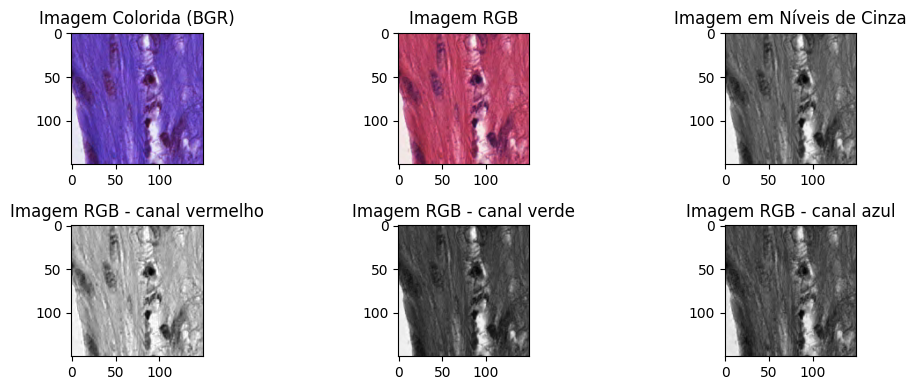

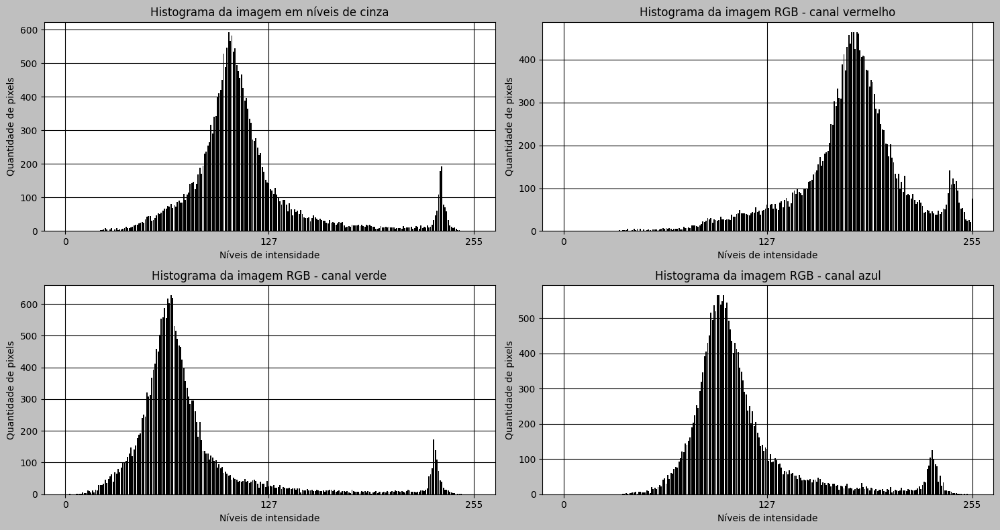

Processando imagem [2]...
Processamento da imagem [2] concluída!


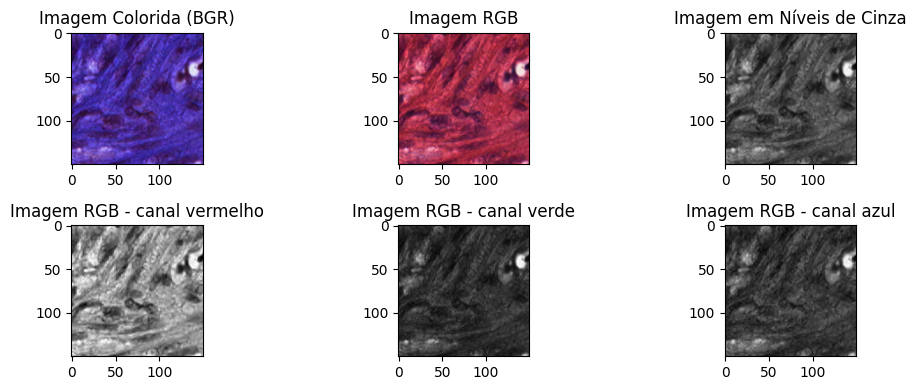

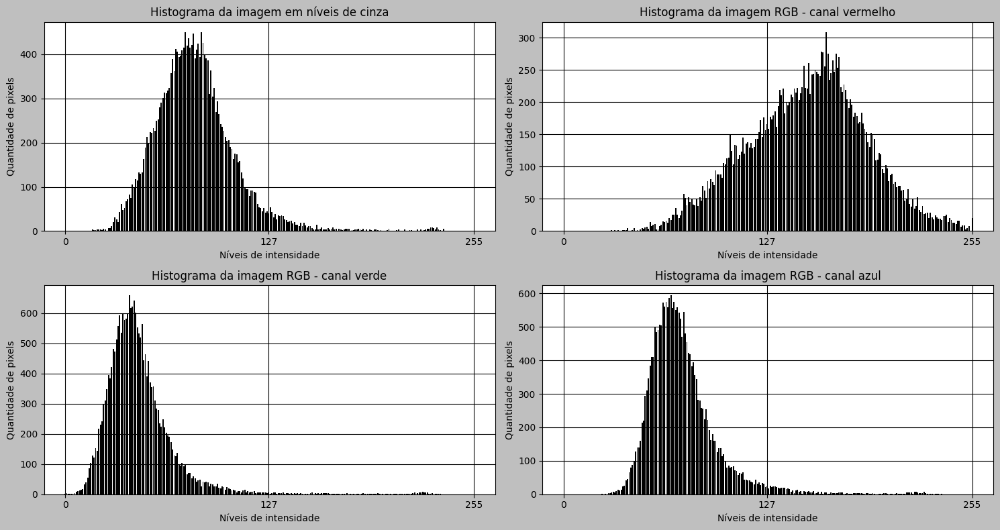

Processando imagem [3]...
Processamento da imagem [3] concluída!


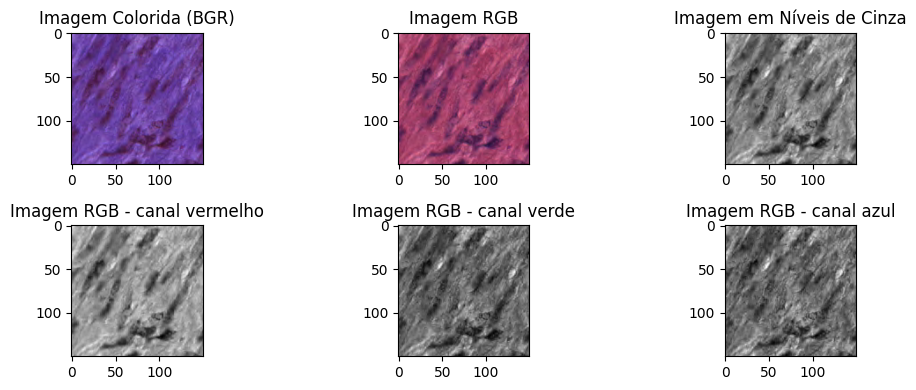

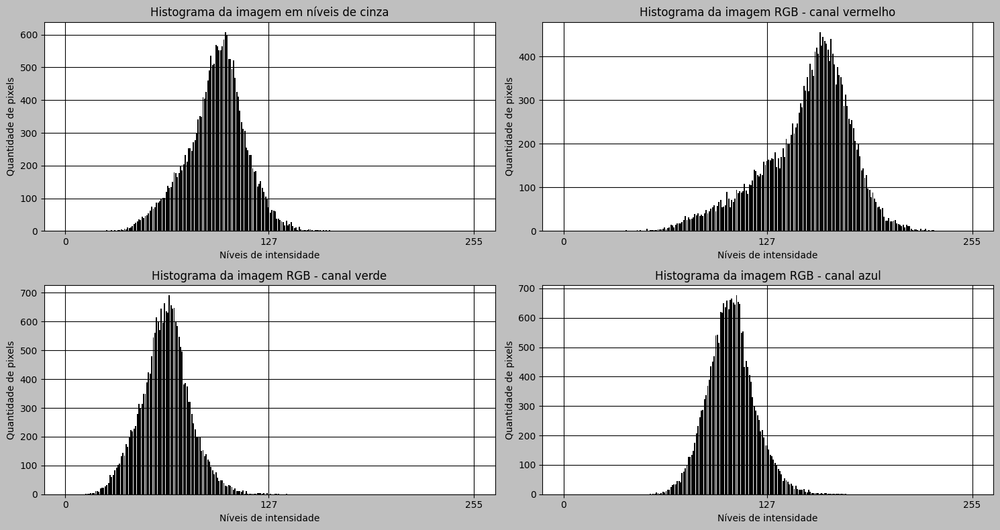

Processando imagem [4]...
Processamento da imagem [4] concluída!


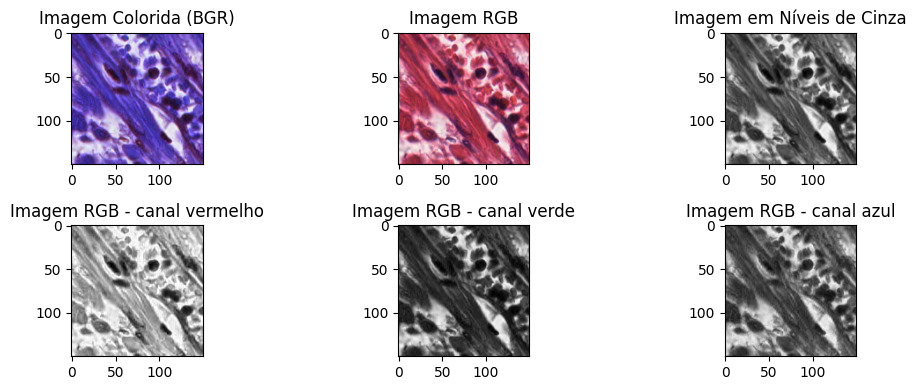

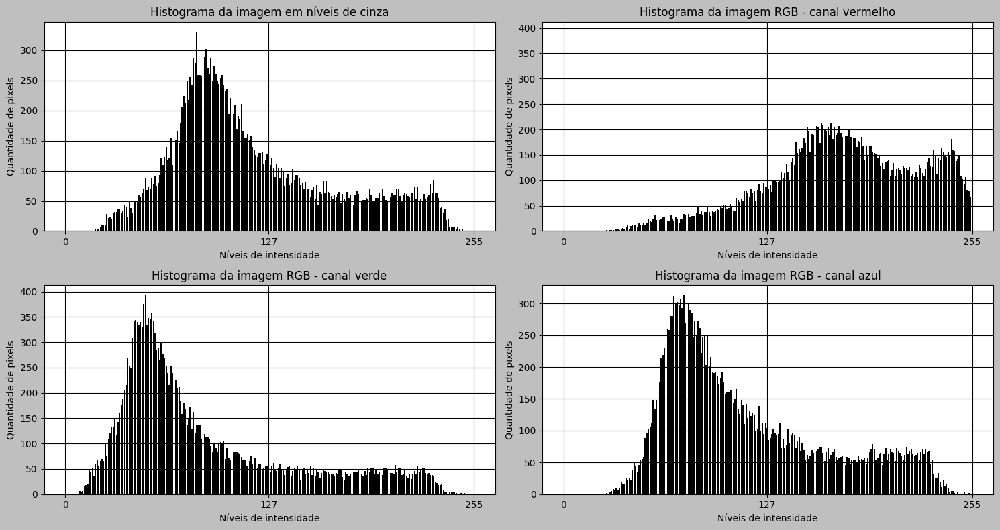

Processando imagem [5]...
Processamento da imagem [5] concluída!


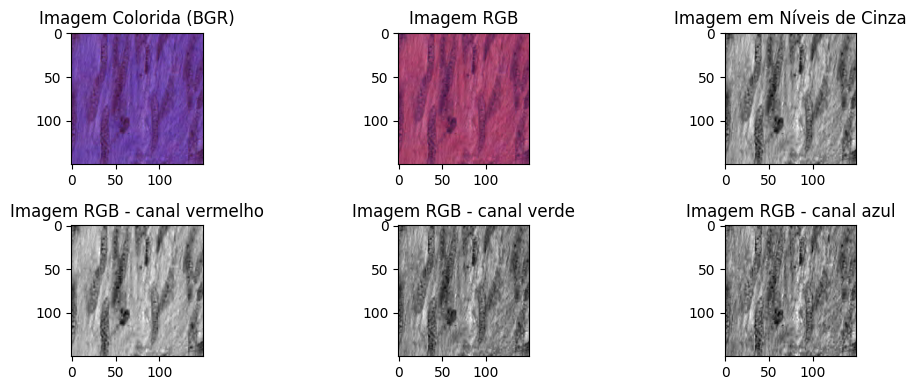

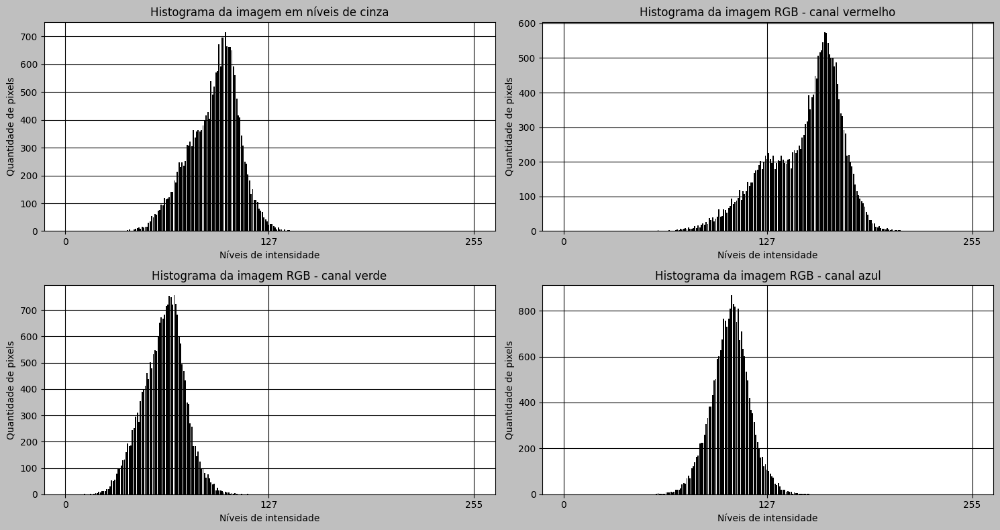

Processando imagem [6]...
Processamento da imagem [6] concluída!


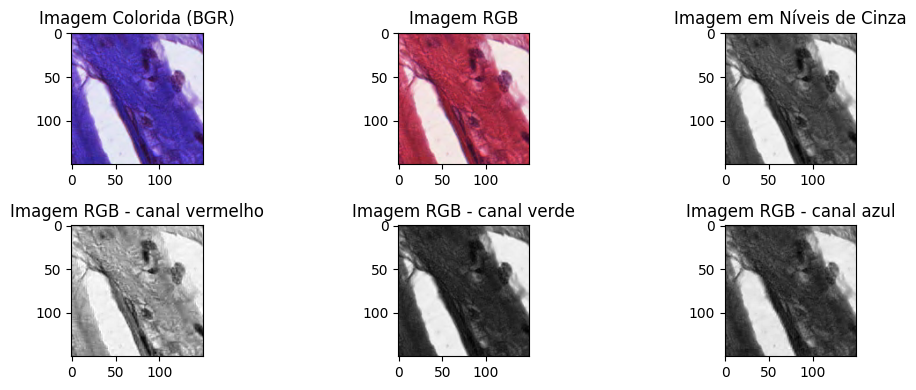

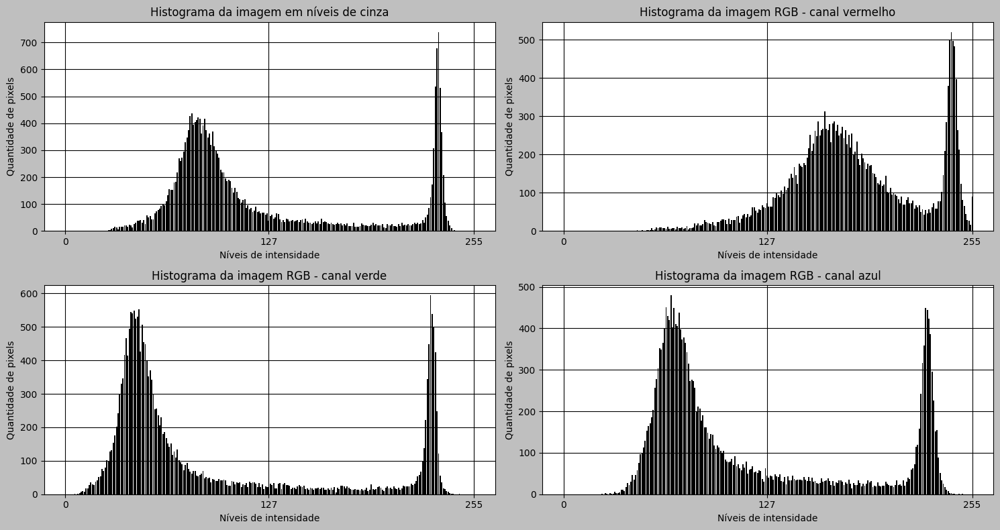

Processando imagem [7]...
Processamento da imagem [7] concluída!


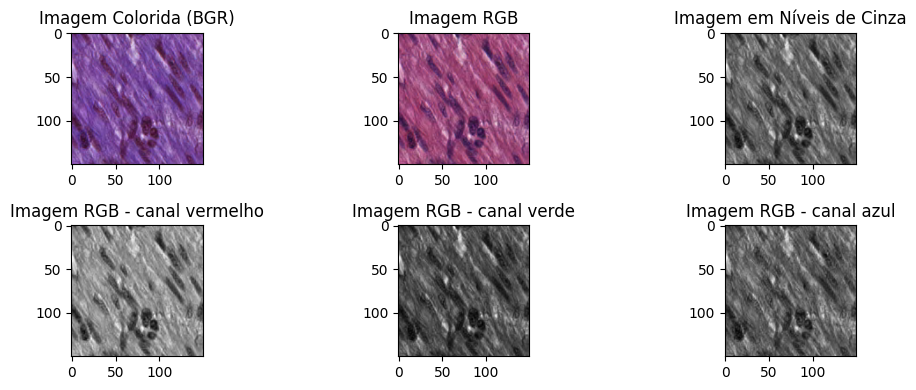

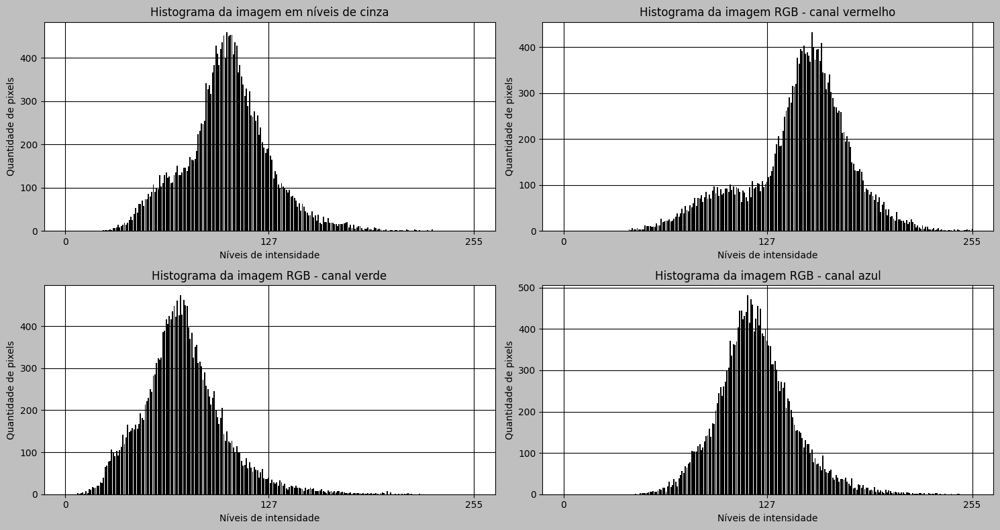

Processando imagem [8]...
Processamento da imagem [8] concluída!


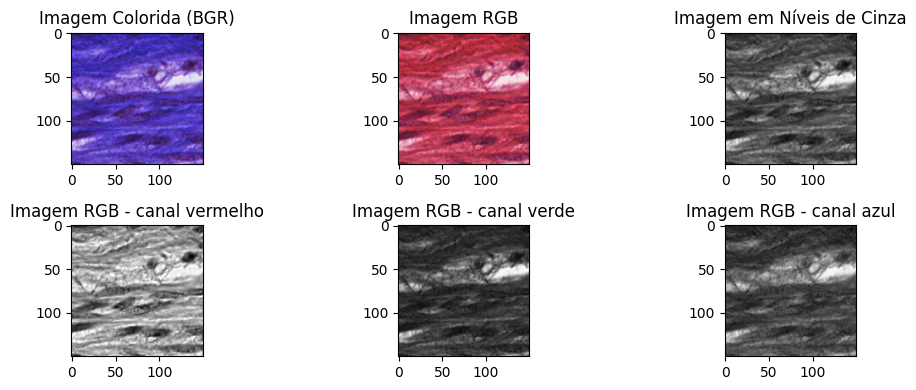

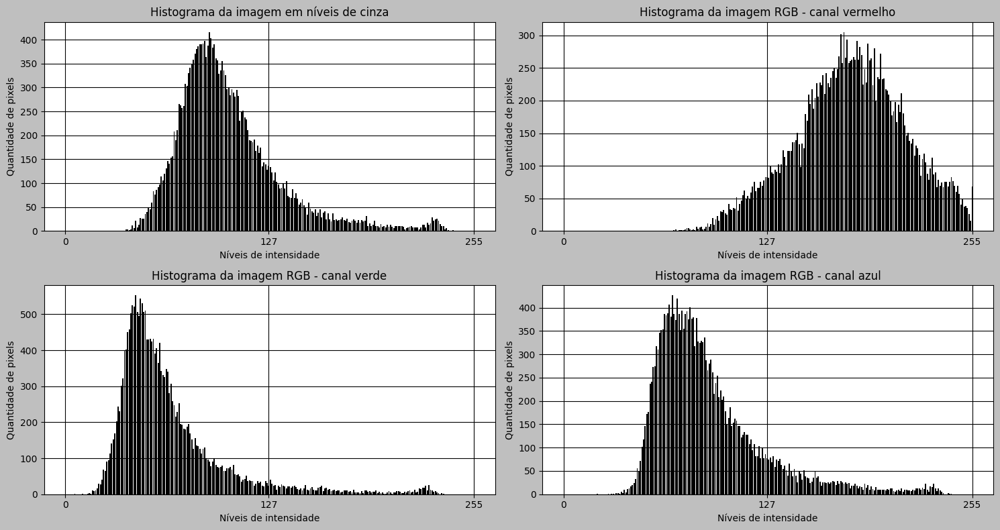

Processando imagem [9]...
Processamento da imagem [9] concluída!


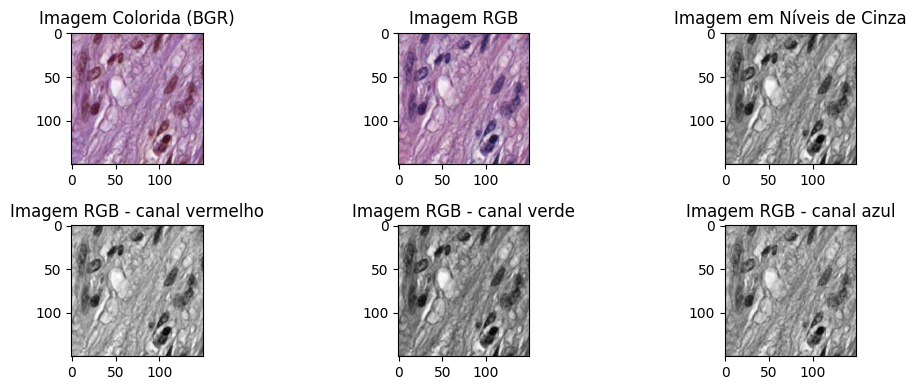

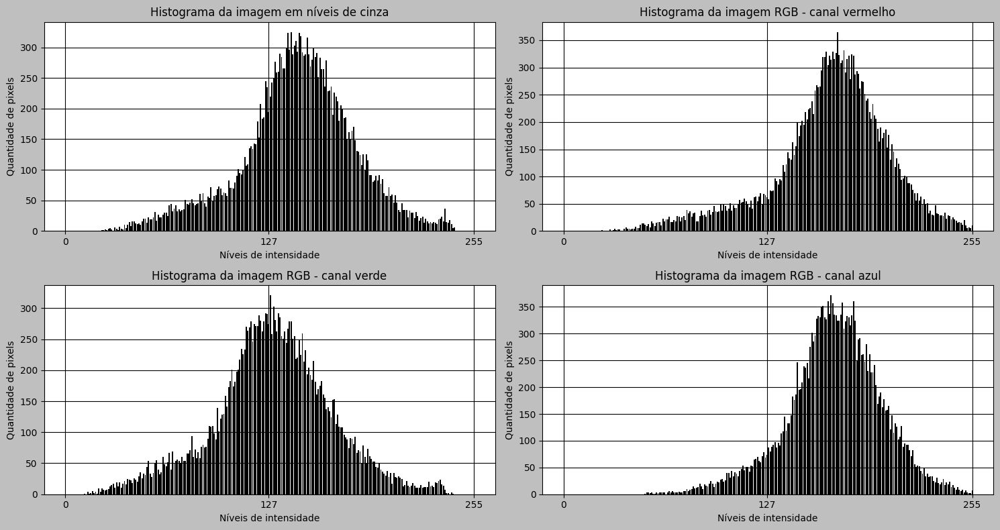

Processando imagem [10]...
Processamento da imagem [10] concluída!


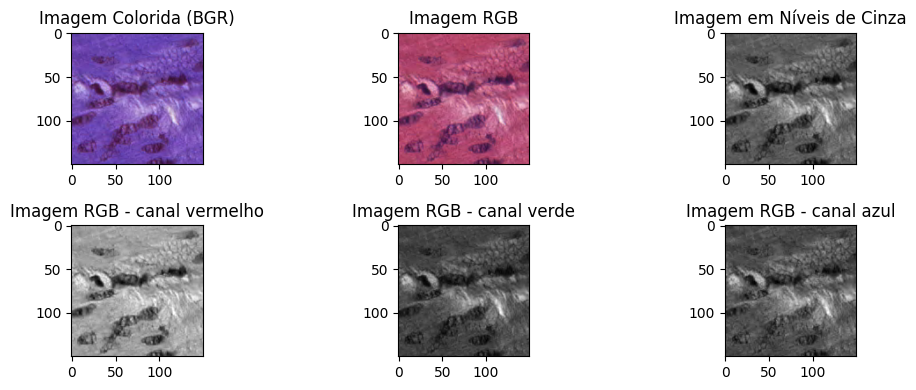

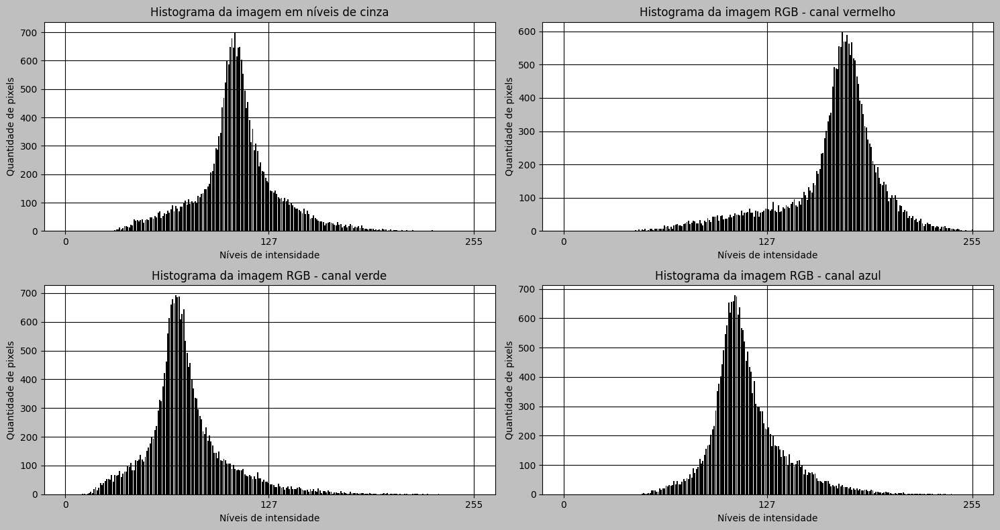

Processando imagem [11]...
Processamento da imagem [11] concluída!


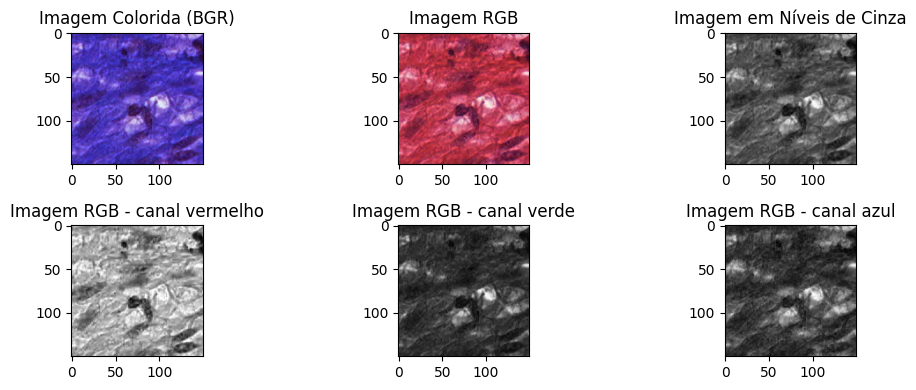

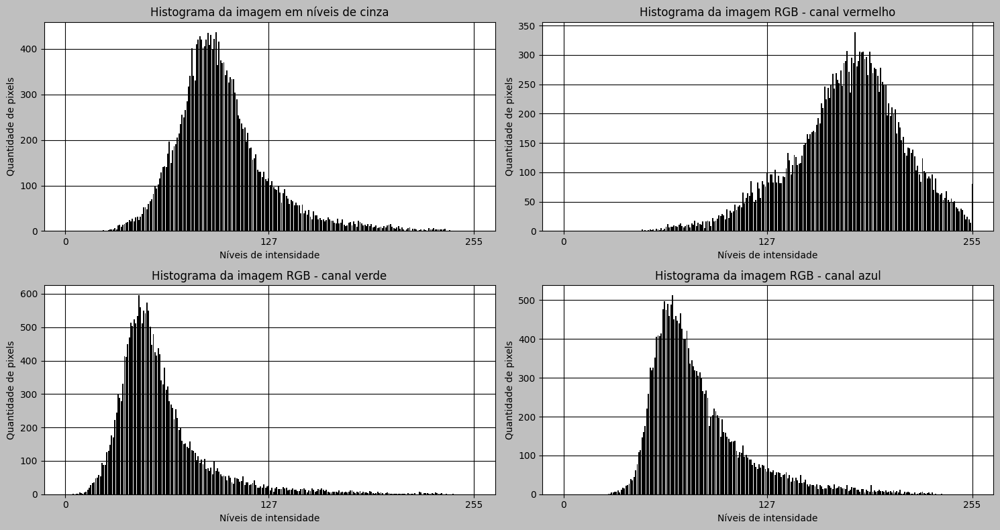

Processando imagem [12]...
Processamento da imagem [12] concluída!


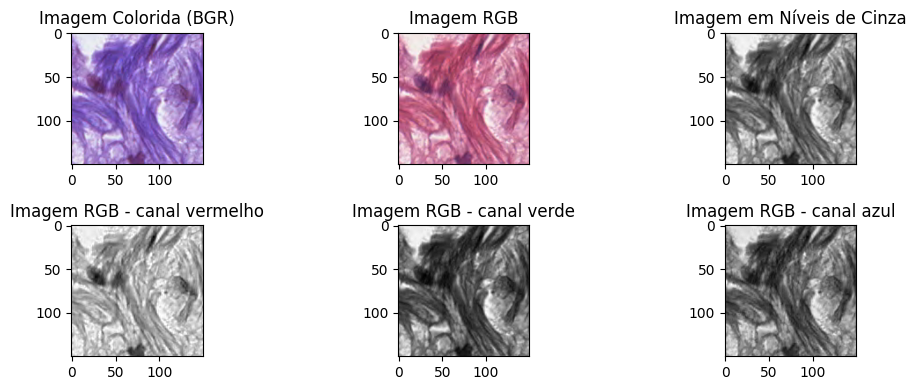

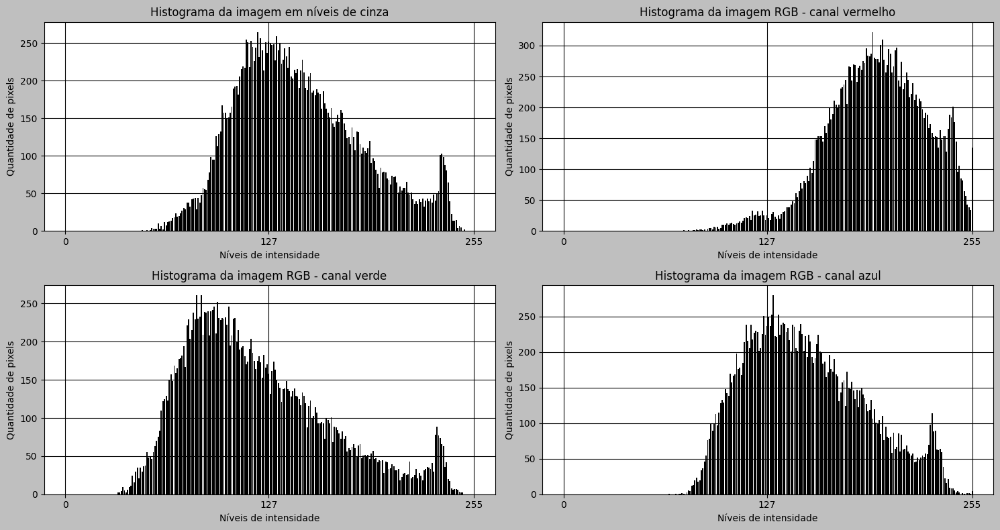

Processando imagem [13]...
Processamento da imagem [13] concluída!


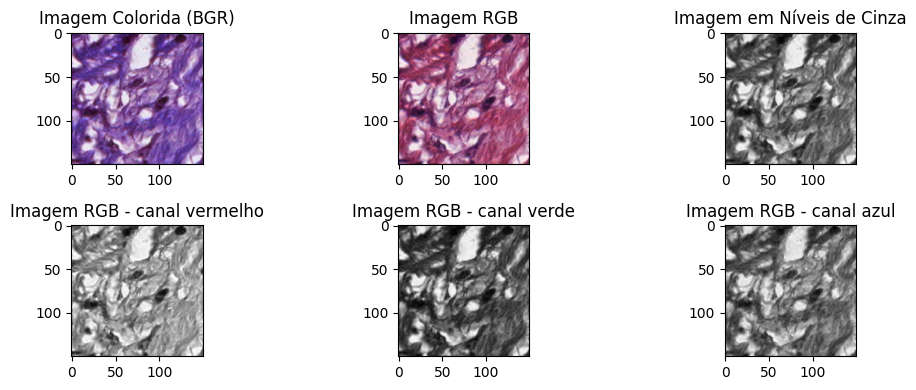

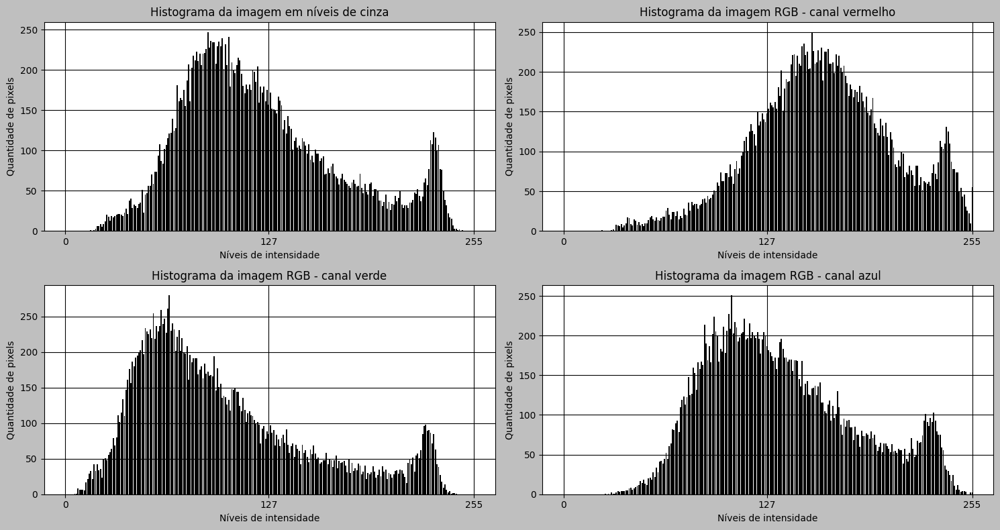

Processando imagem [14]...
Processamento da imagem [14] concluída!


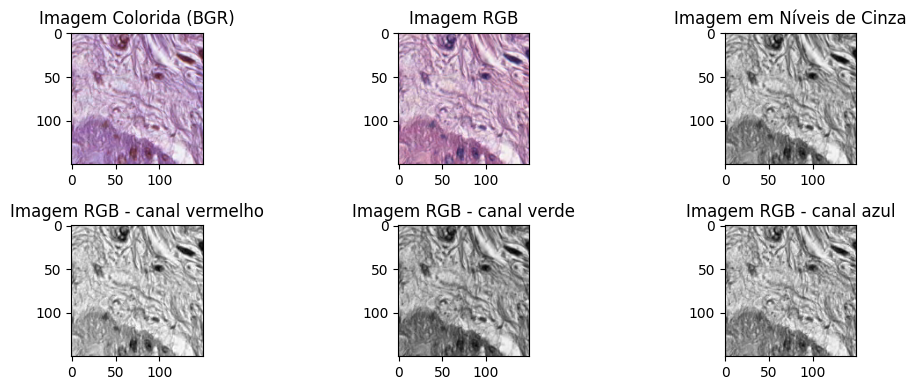

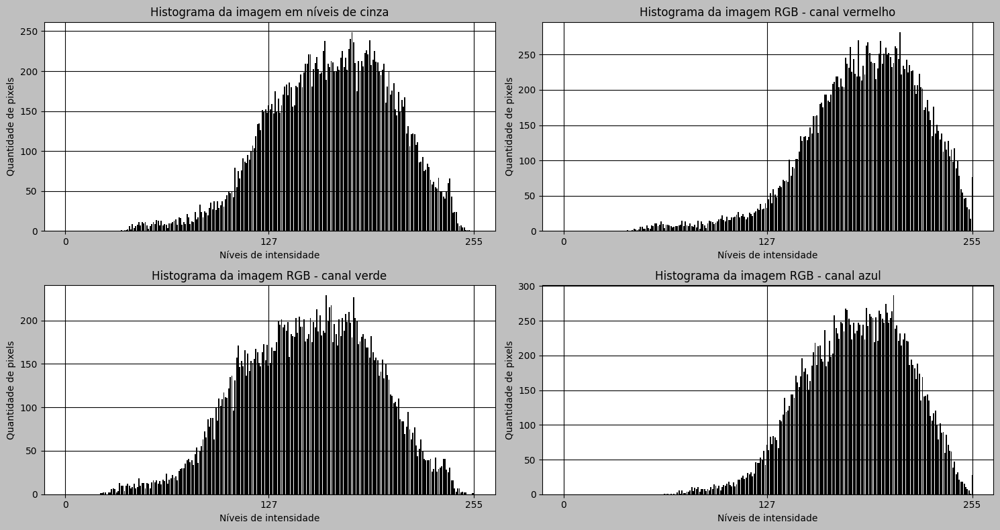

Processando imagem [15]...
Processamento da imagem [15] concluída!


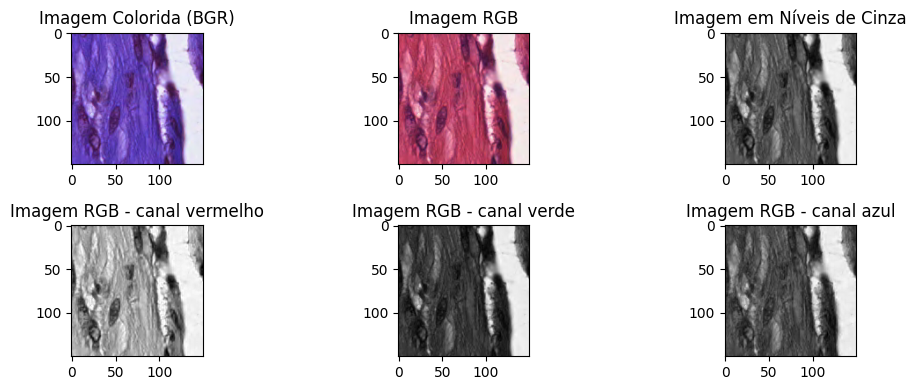

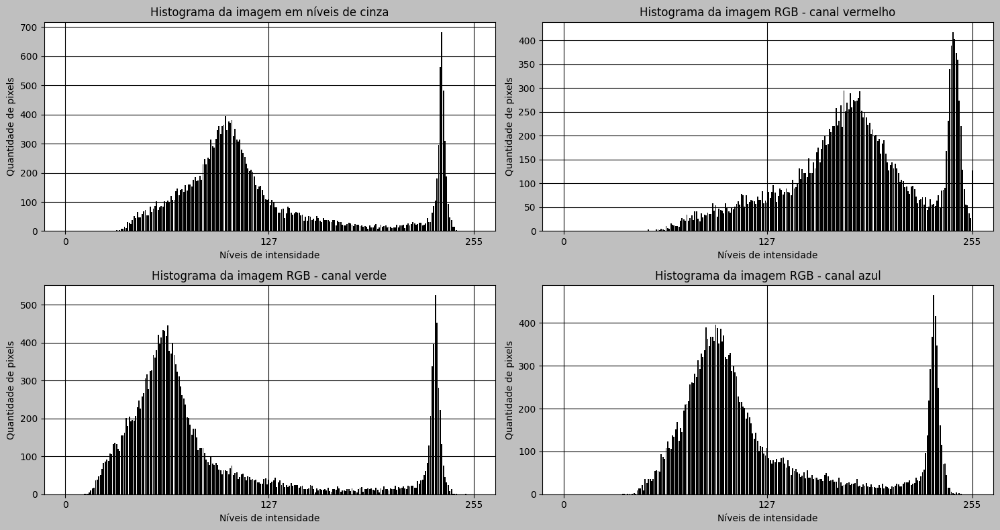

Processando imagem [16]...
Processamento da imagem [16] concluída!


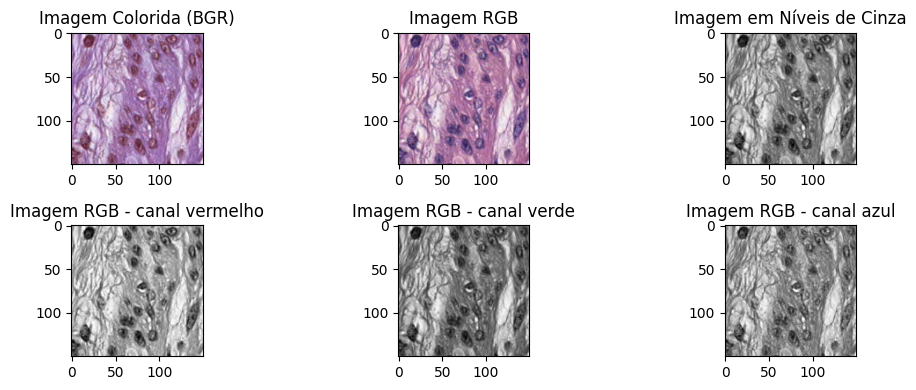

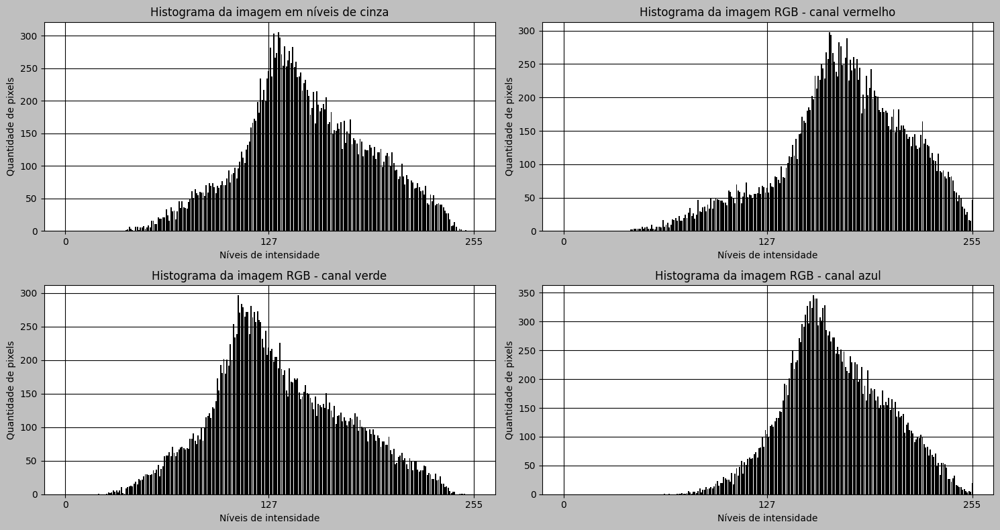

Processando imagem [17]...
Processamento da imagem [17] concluída!


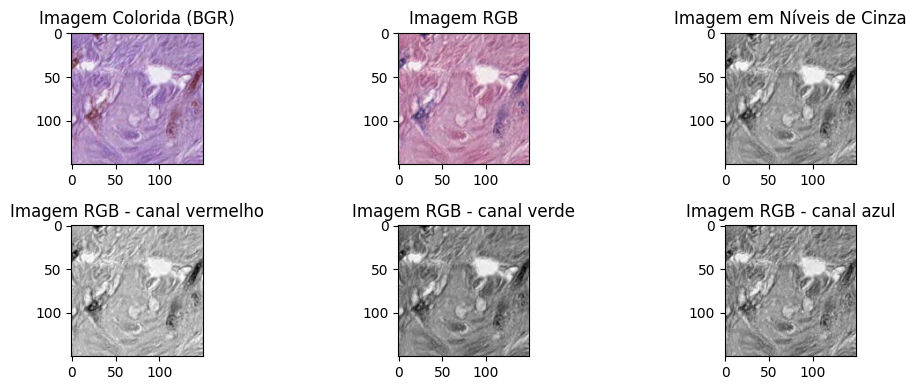

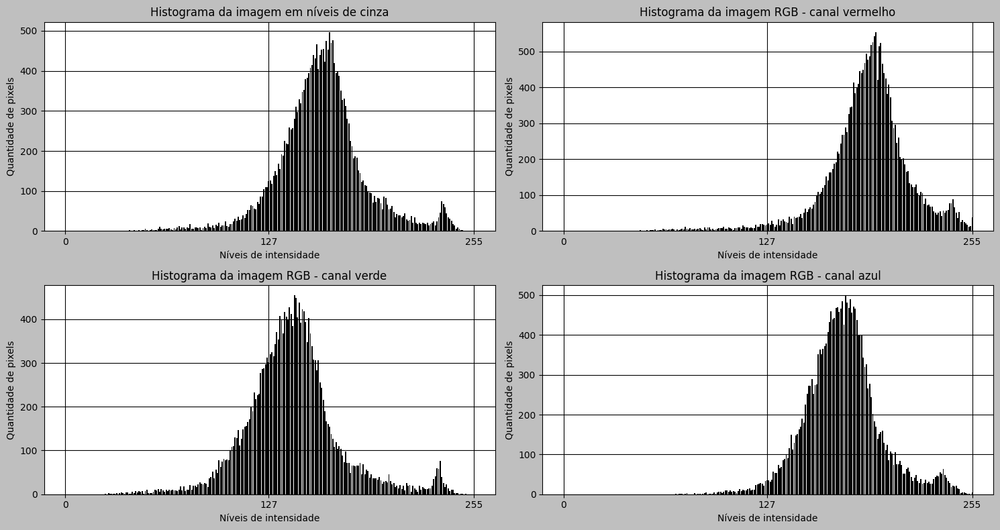

Processando imagem [18]...
Processamento da imagem [18] concluída!


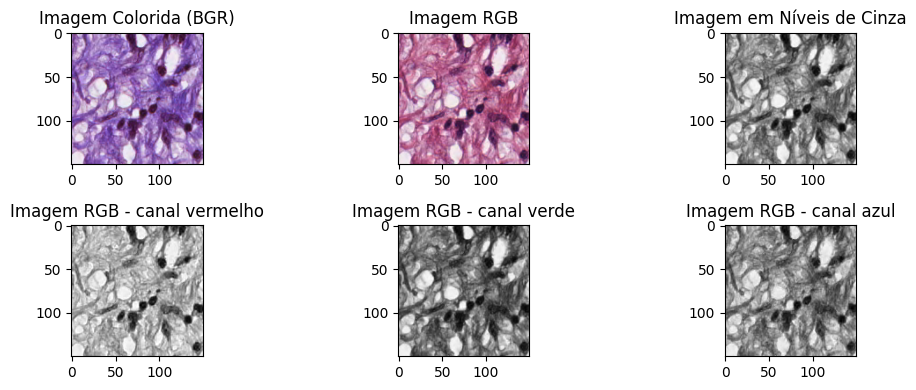

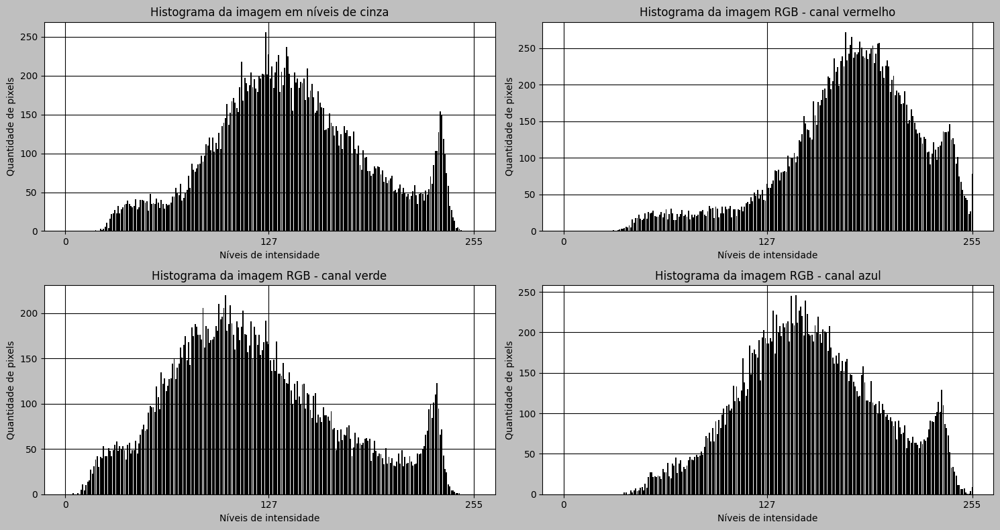

Processando imagem [19]...
Processamento da imagem [19] concluída!


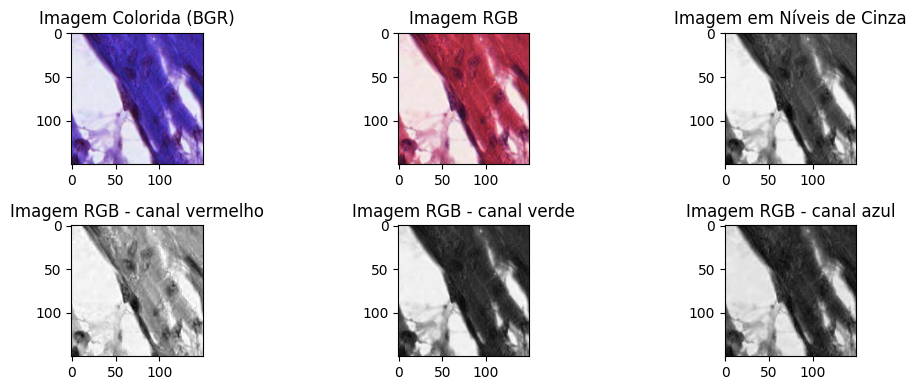

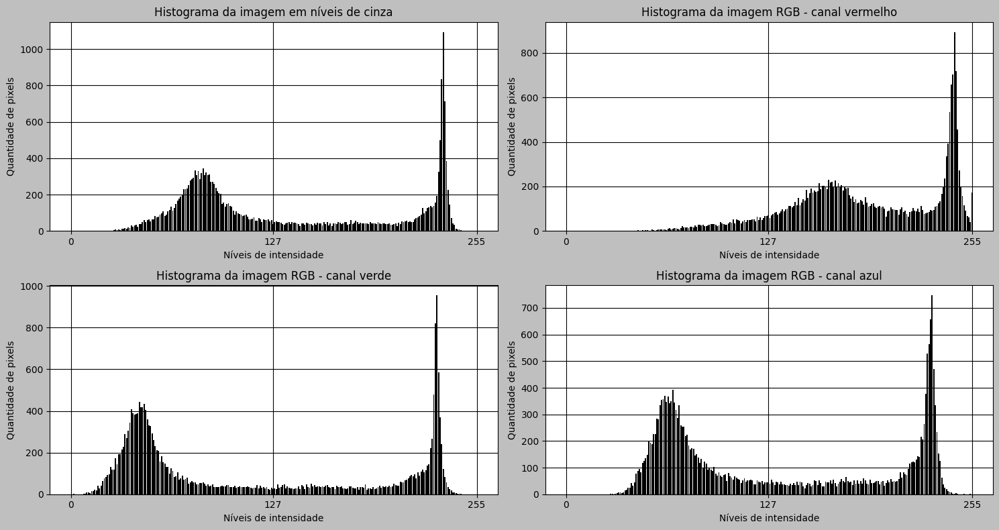

Processando imagem [20]...
Processamento da imagem [20] concluída!


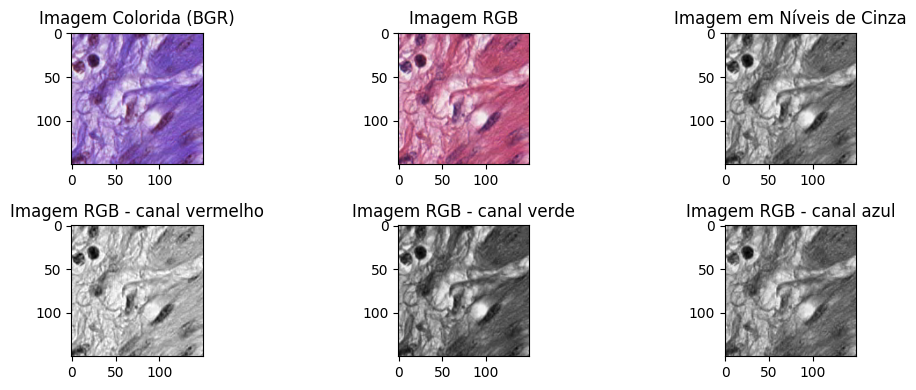

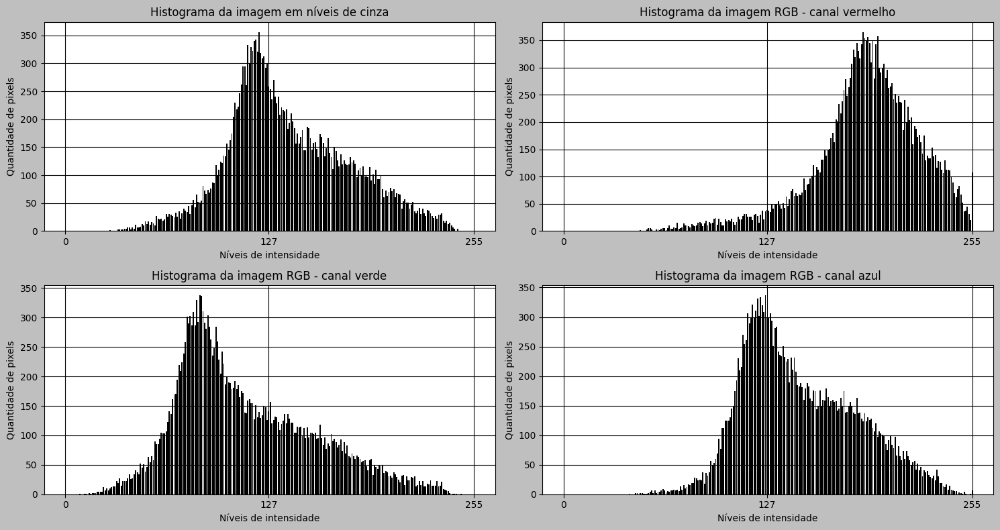

Processando imagem [21]...
Processamento da imagem [21] concluída!


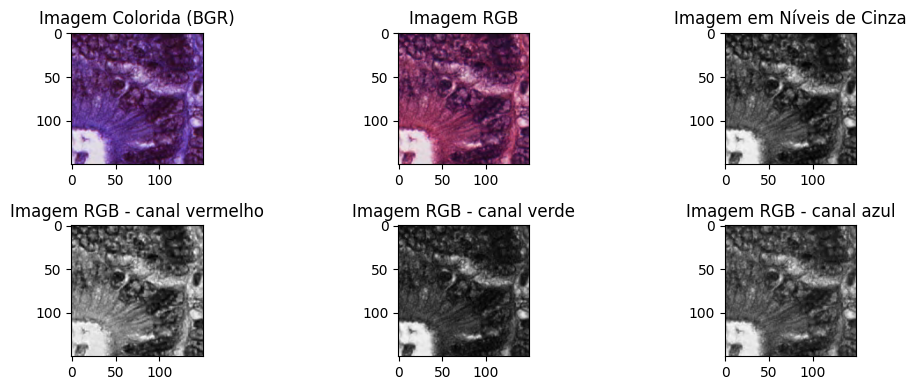

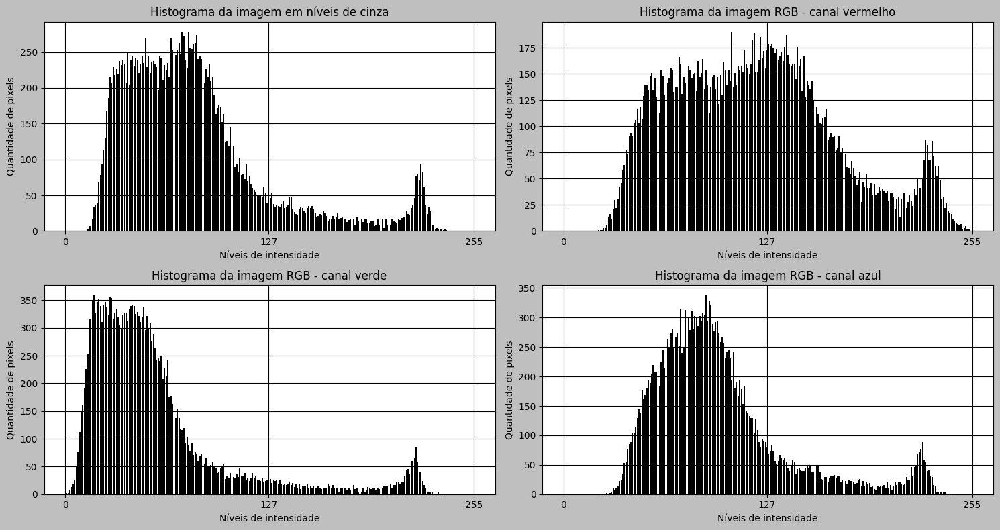

Processando imagem [22]...
Processamento da imagem [22] concluída!


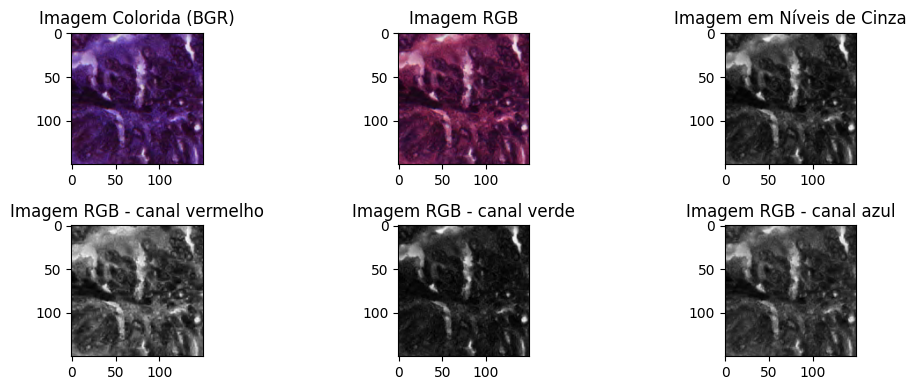

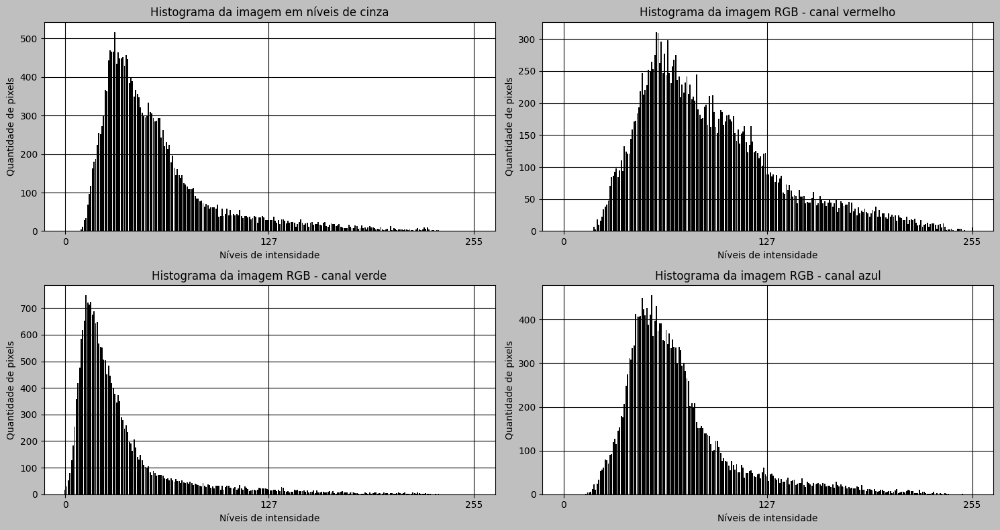

Processando imagem [23]...
Processamento da imagem [23] concluída!


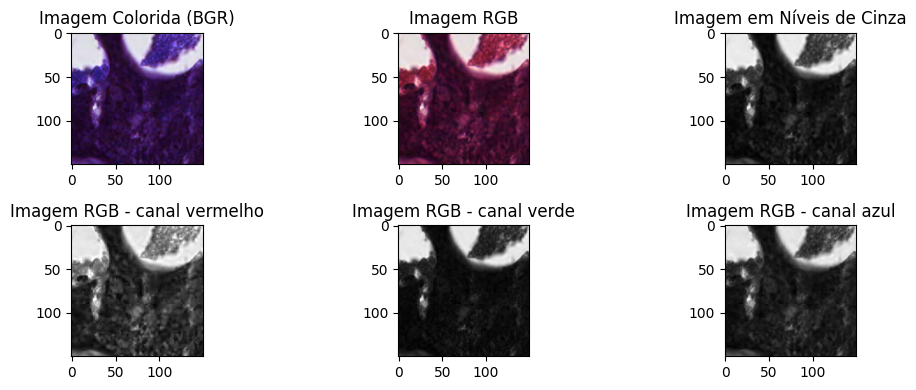

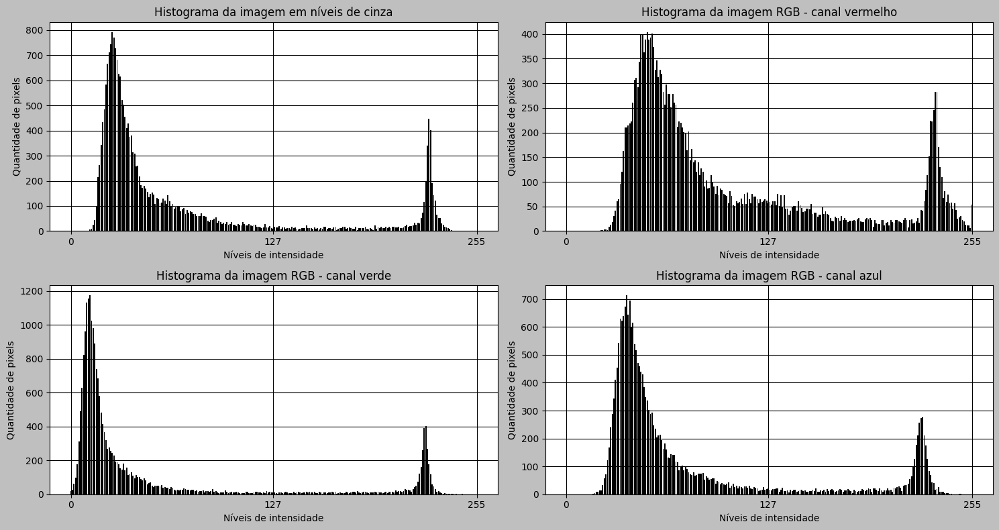

Processando imagem [24]...
Processamento da imagem [24] concluída!


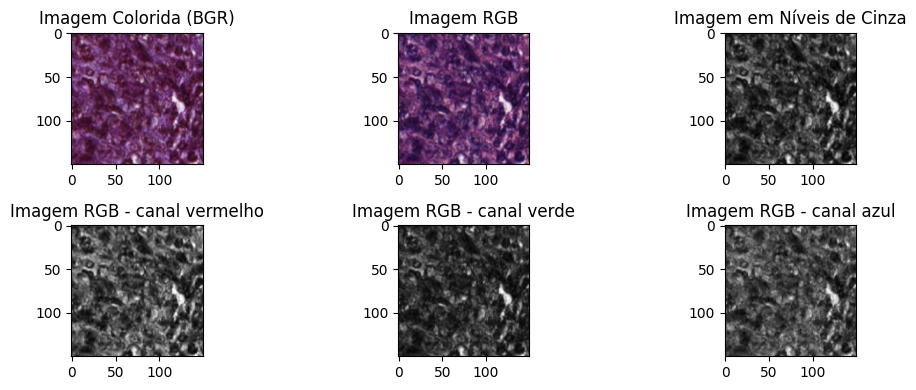

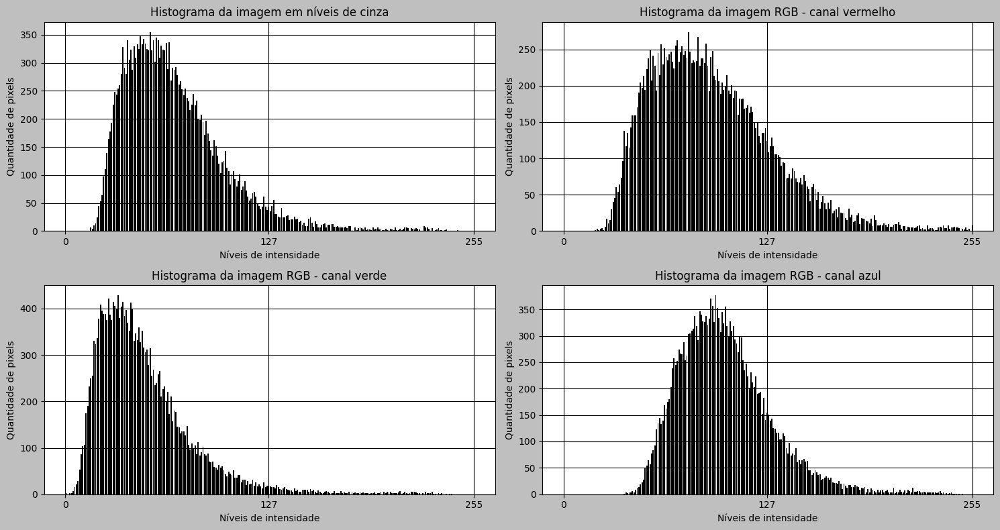

Processando imagem [25]...
Processamento da imagem [25] concluída!


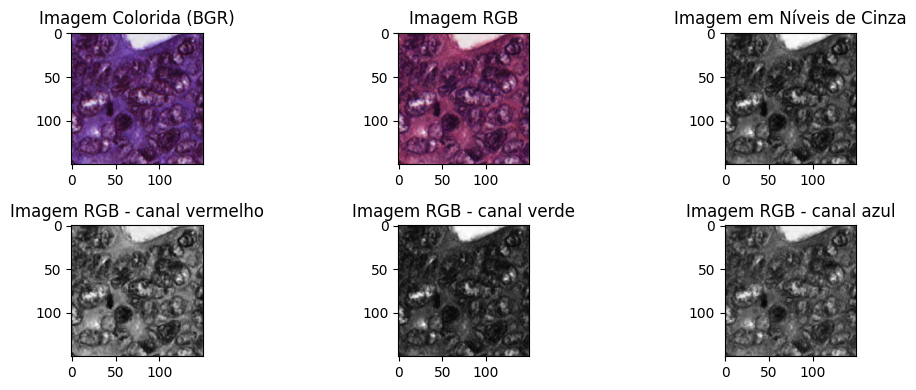

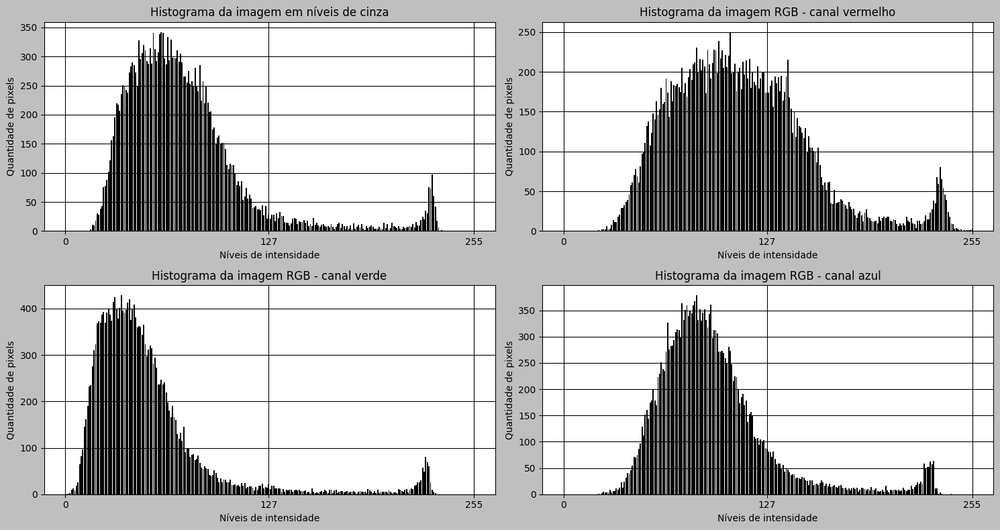

Processando imagem [26]...
Processamento da imagem [26] concluída!


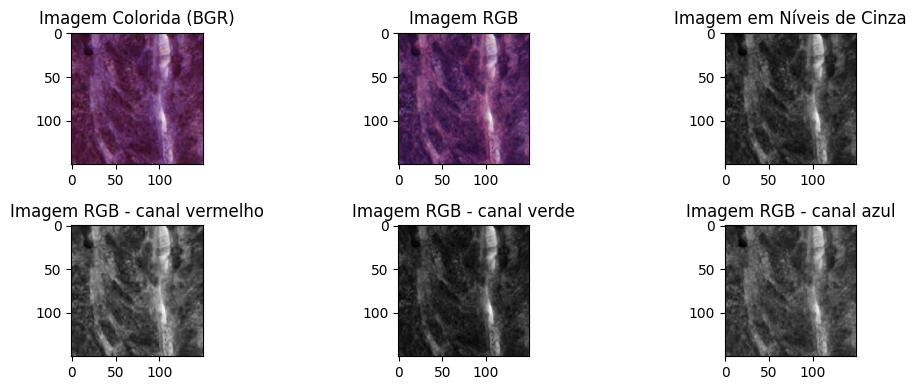

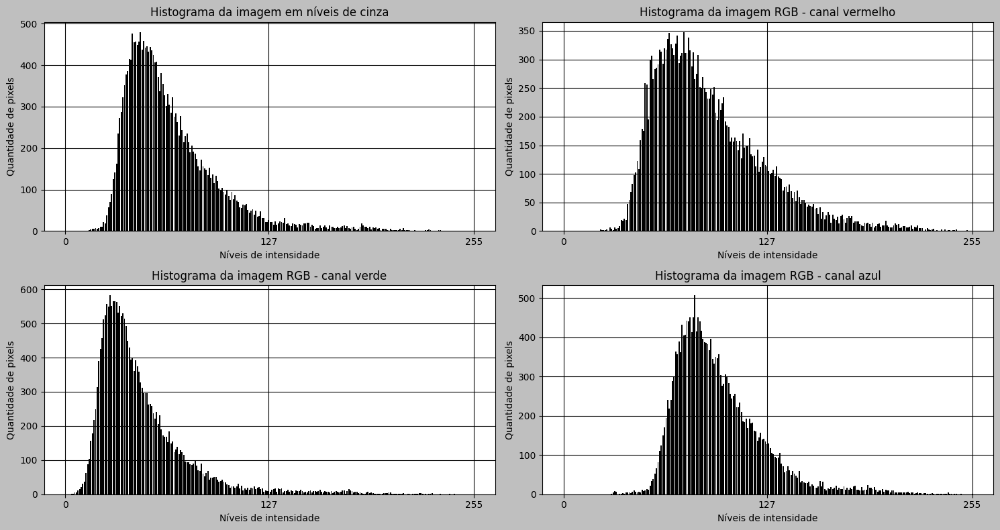

Processando imagem [27]...
Processamento da imagem [27] concluída!


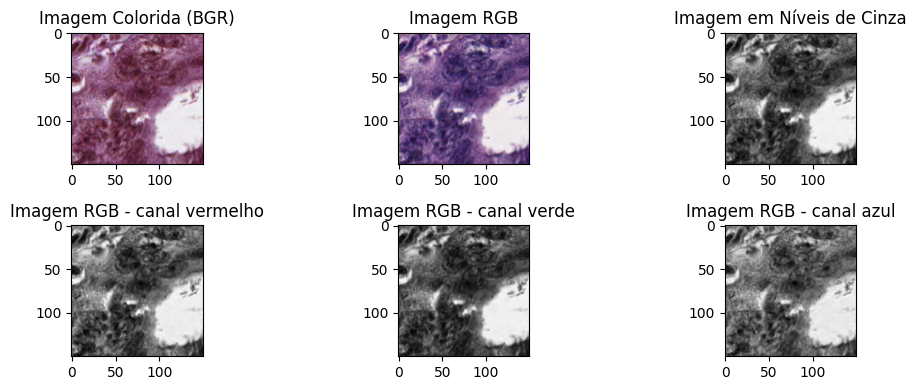

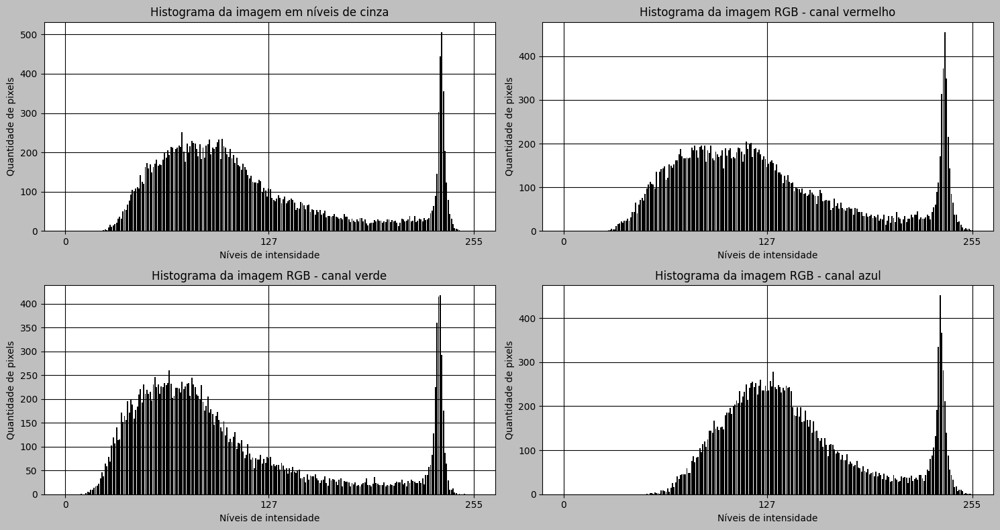

Processando imagem [28]...
Processamento da imagem [28] concluída!


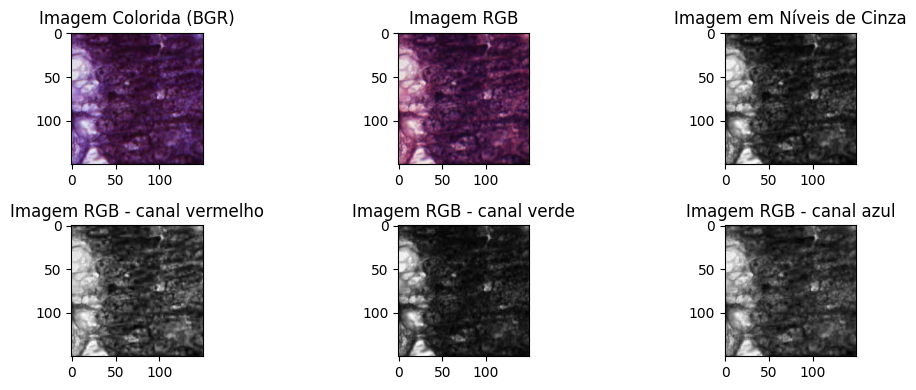

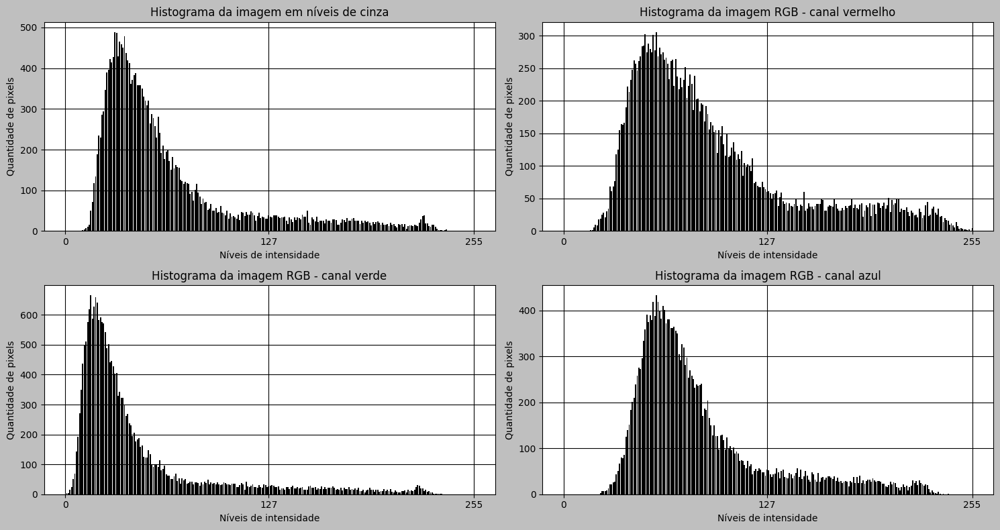

Processando imagem [29]...
Processamento da imagem [29] concluída!


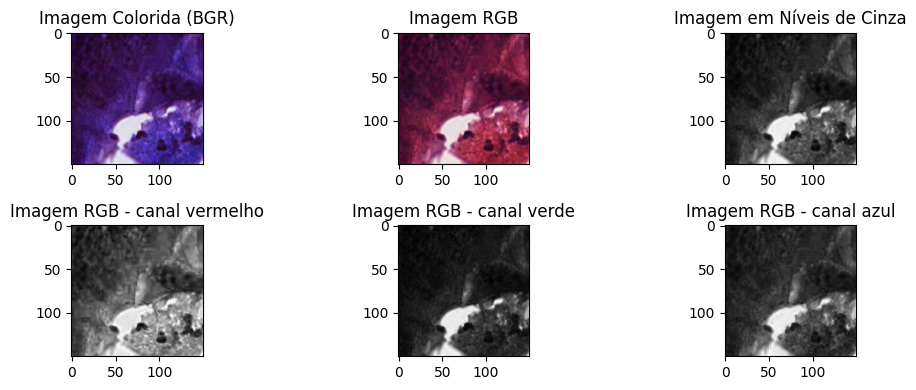

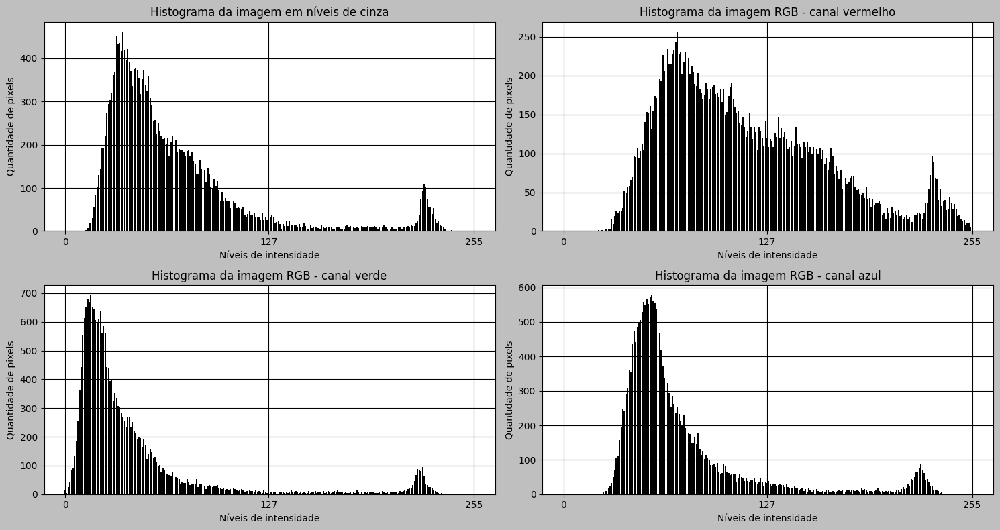

Processando imagem [30]...
Processamento da imagem [30] concluída!


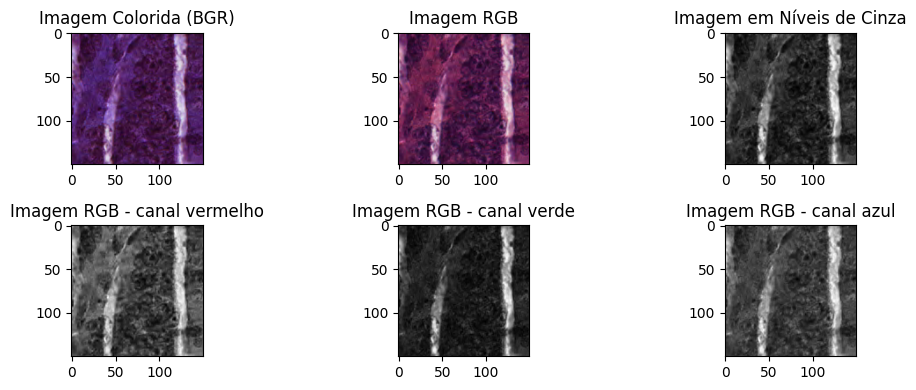

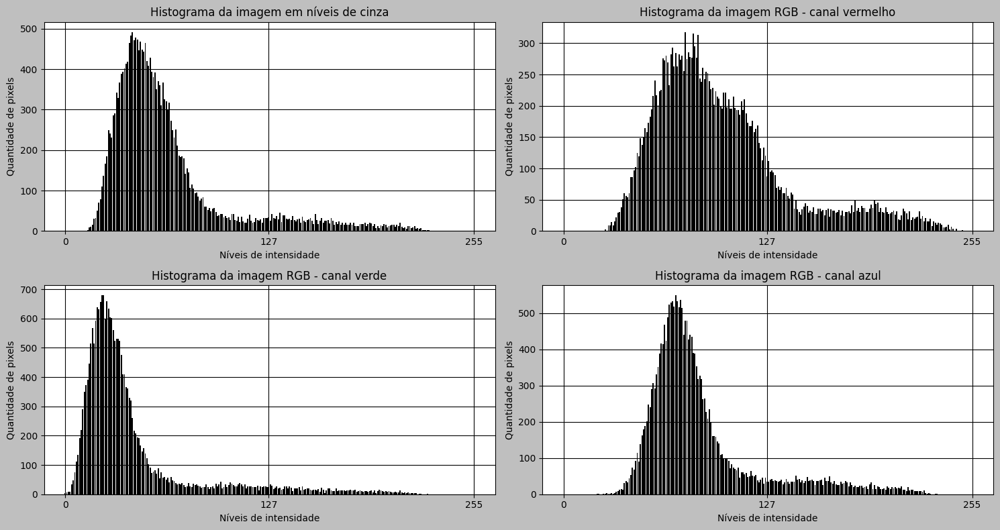

Processando imagem [31]...
Processamento da imagem [31] concluída!


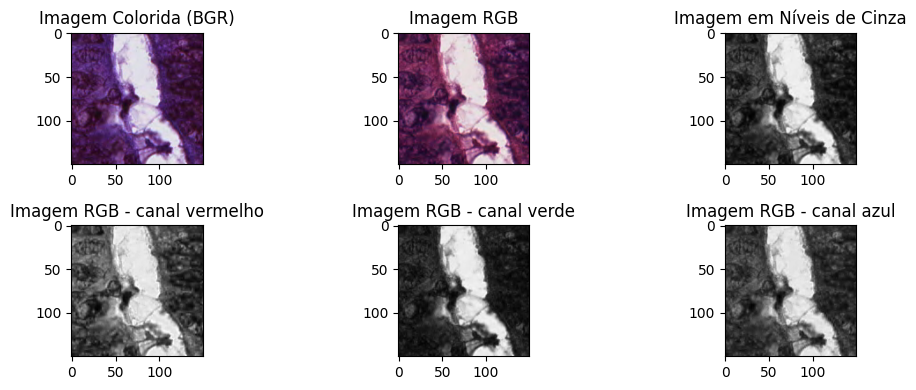

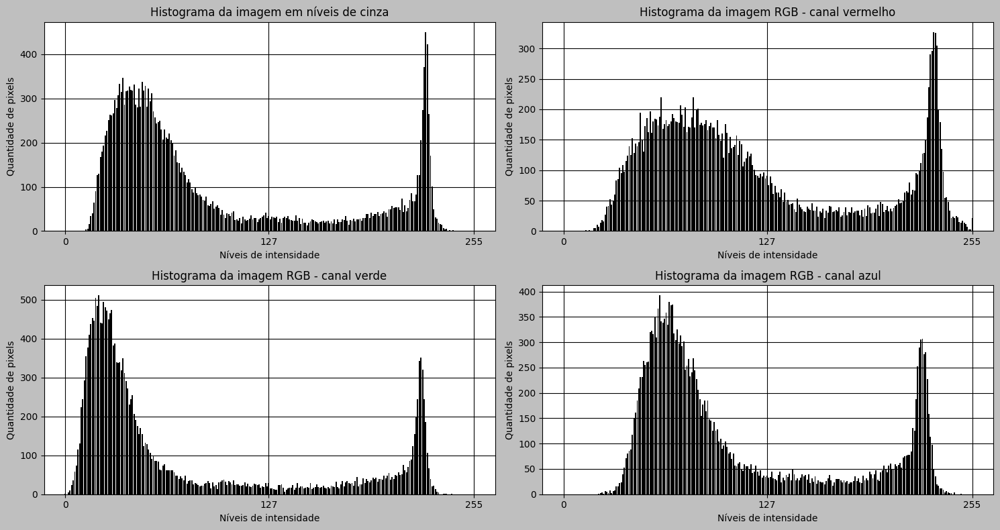

Processando imagem [32]...
Processamento da imagem [32] concluída!


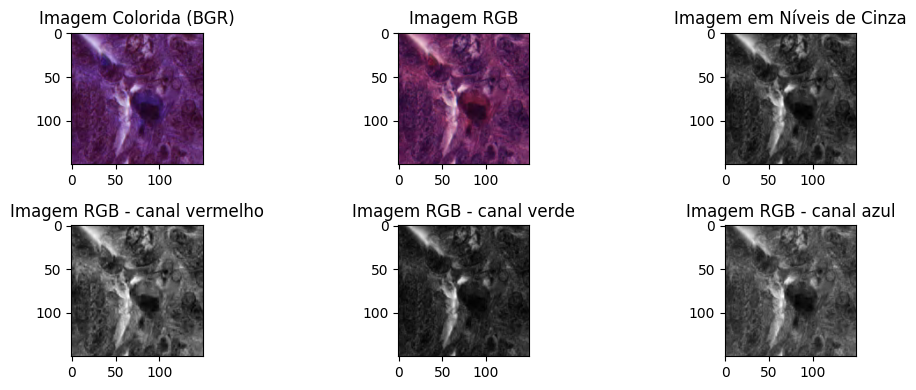

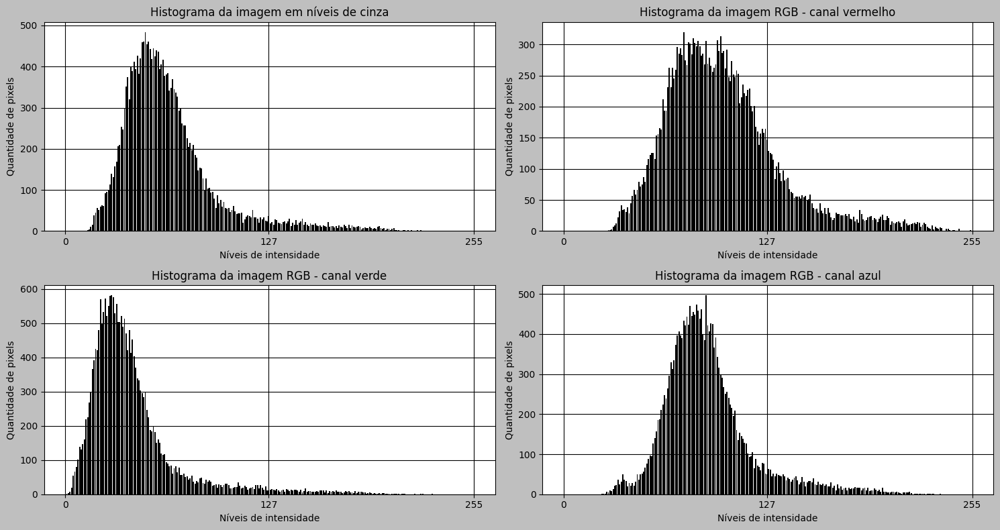

Processando imagem [33]...
Processamento da imagem [33] concluída!


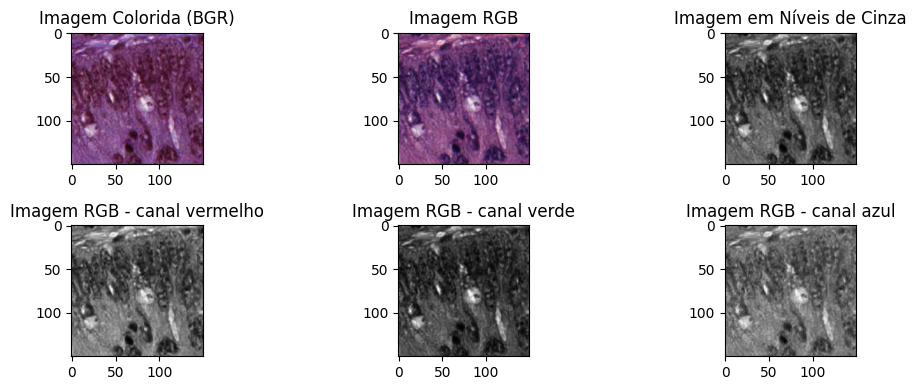

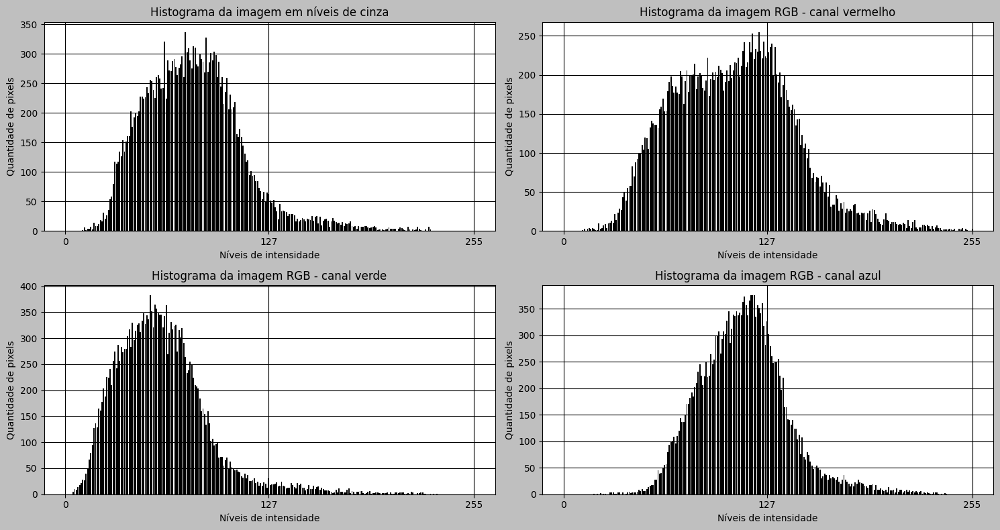

Processando imagem [34]...
Processamento da imagem [34] concluída!


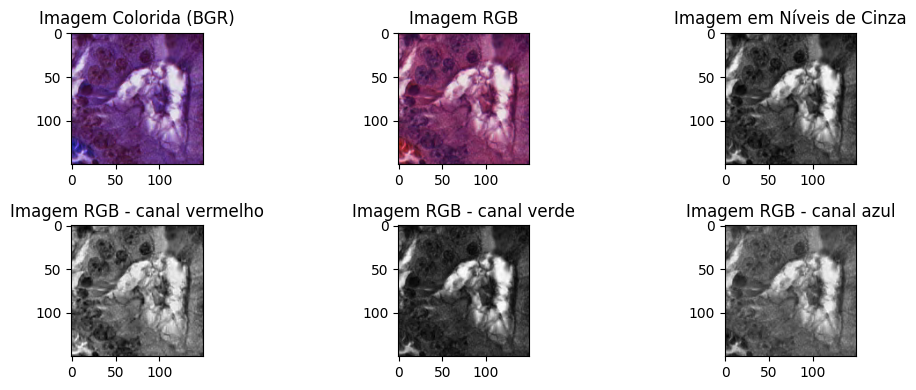

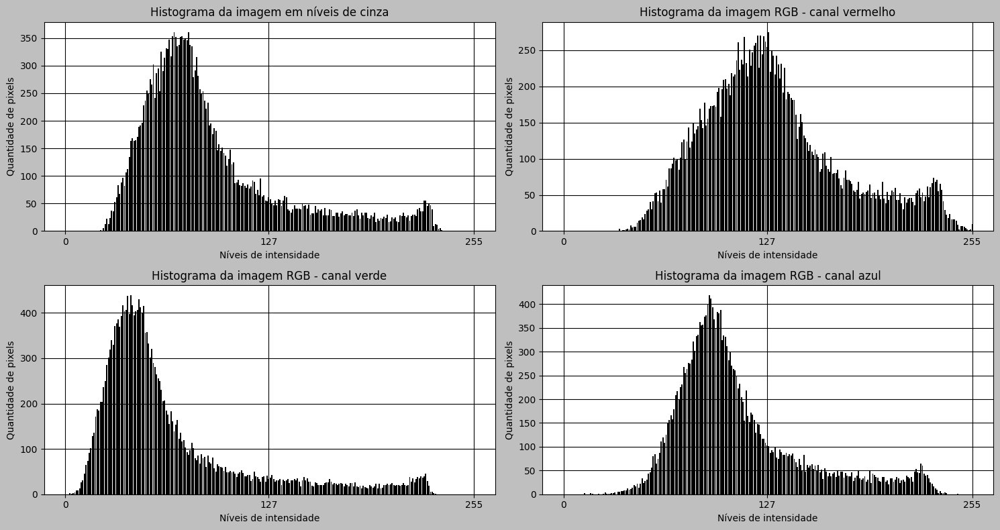

Processando imagem [35]...
Processamento da imagem [35] concluída!


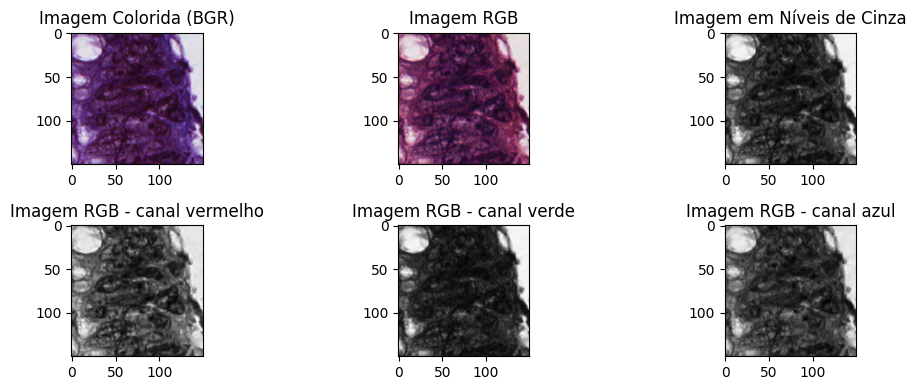

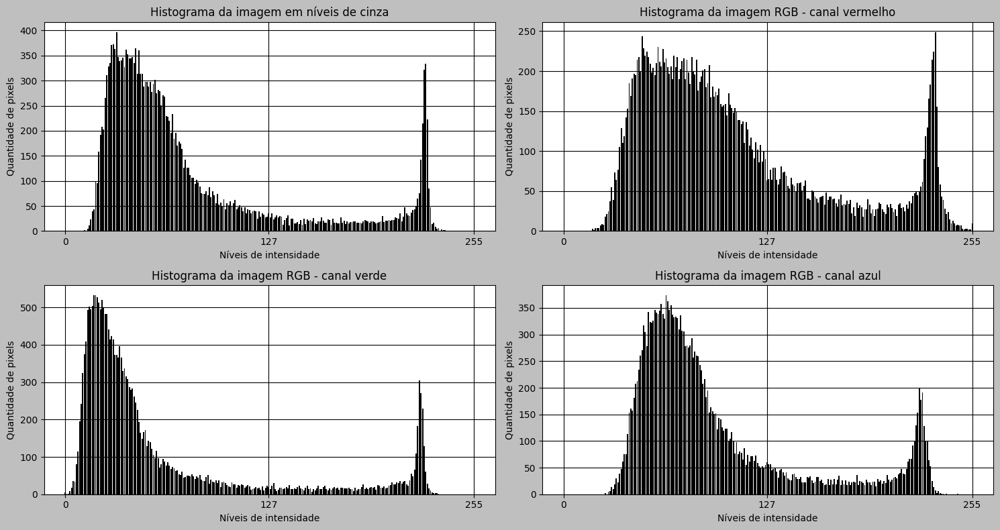

Processando imagem [36]...
Processamento da imagem [36] concluída!


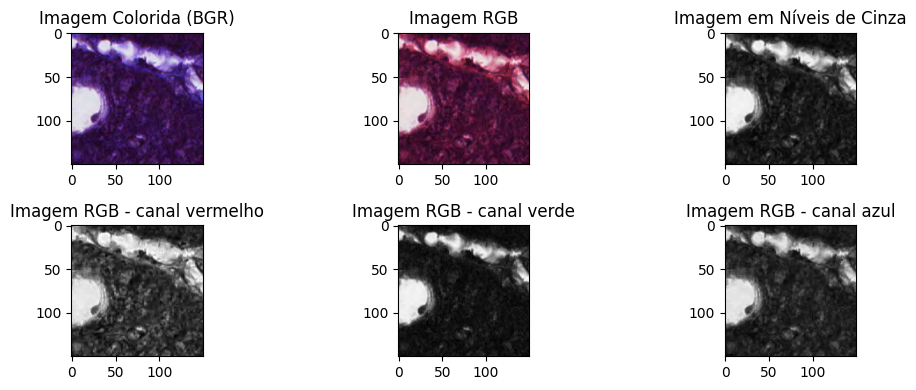

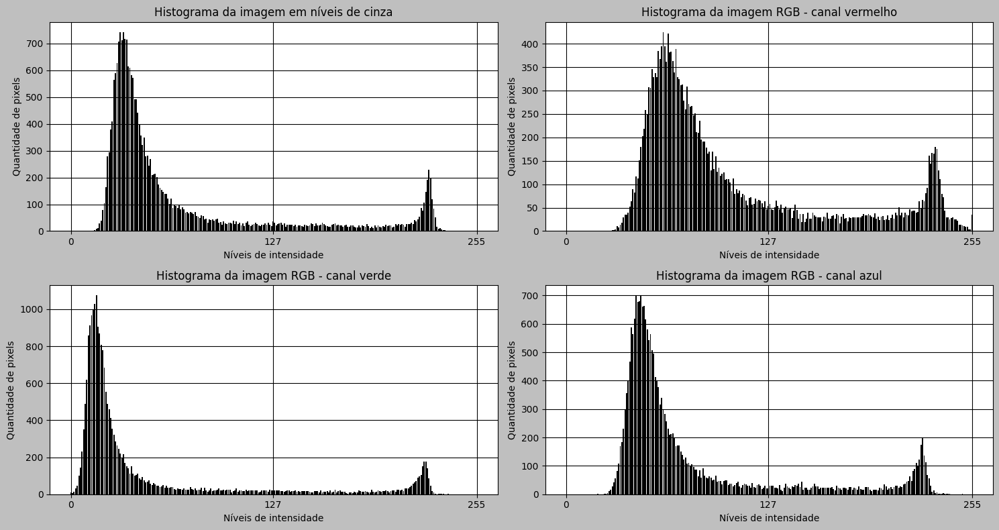

Processando imagem [37]...
Processamento da imagem [37] concluída!


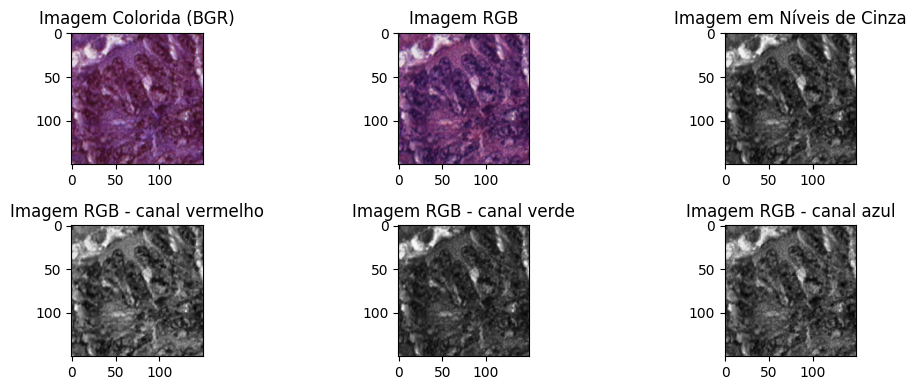

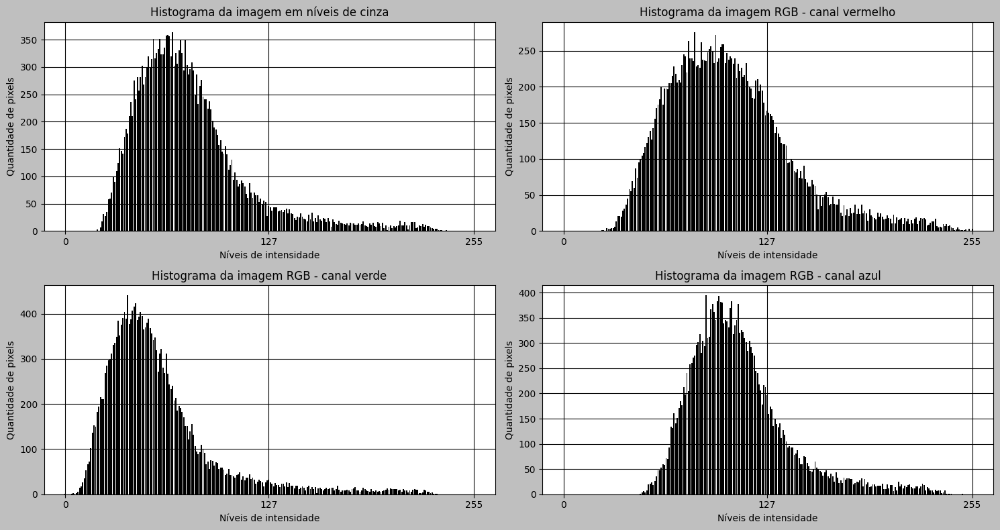

Processando imagem [38]...
Processamento da imagem [38] concluída!


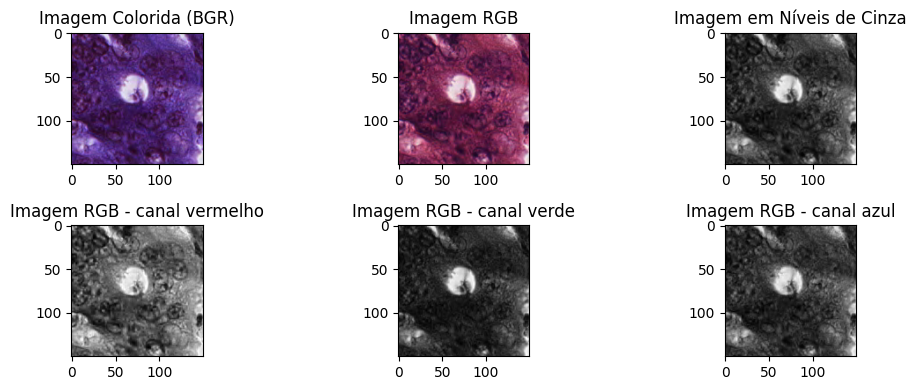

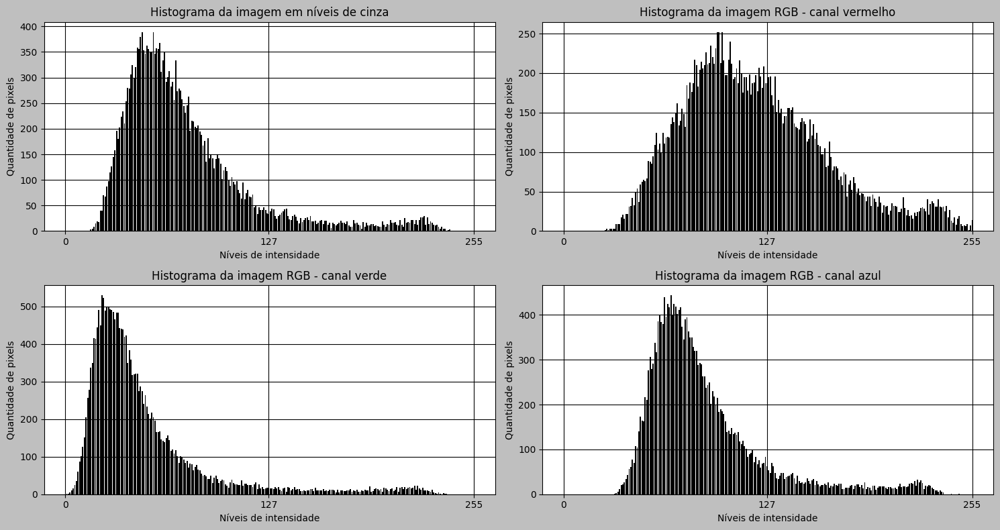

Processando imagem [39]...
Processamento da imagem [39] concluída!


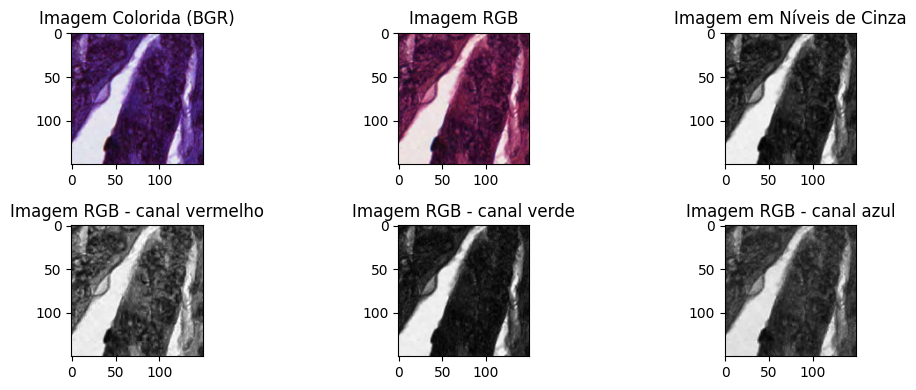

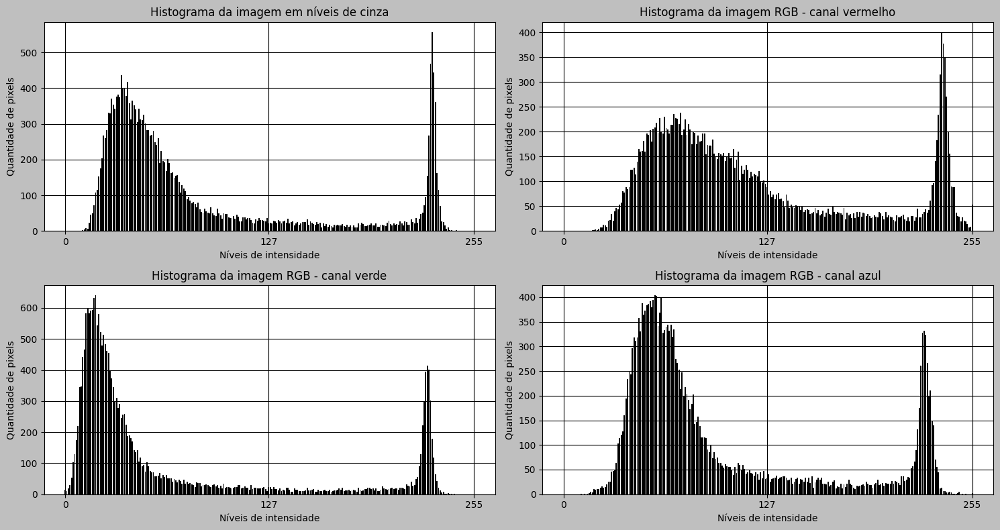

Processando imagem [40]...
Processamento da imagem [40] concluída!


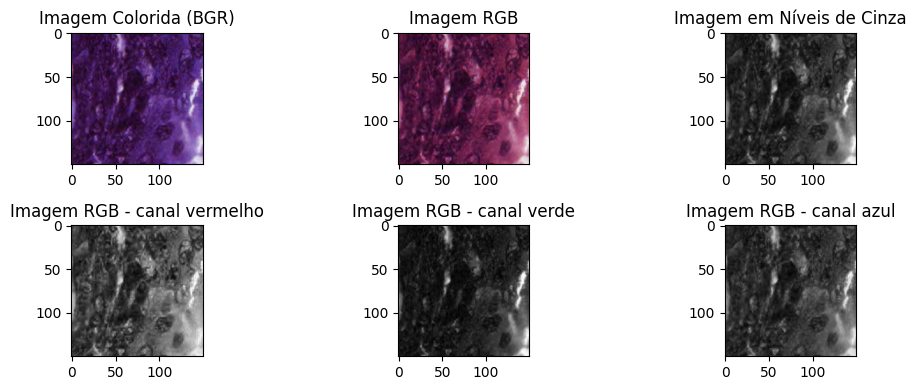

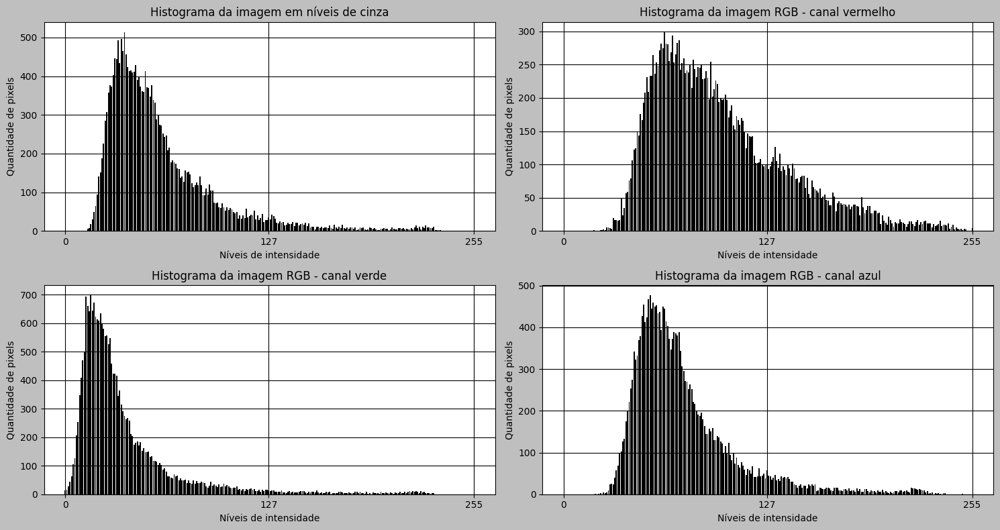

Extração de características realizada com sucesso!
Escrevendo arquivos CSV...
Escrita de arquivos CSV concluída!
Processo concluído com sucesso!


In [ ]:
### Nesse bloco são obtidas as características das imagens e, depois, essas são
###   escritas em arquivos CSV.
#------------------------------------------------------------------------------#

# Leitura das imagens na pasta
imgs =  [(cv.imread(f), f.split("/")[6]) for f in glob.glob(root_folder + 'benigno/*.tif')] + \
        [(cv.imread(f), f.split("/")[6]) for f in glob.glob(root_folder + 'maligno/*.tif')]

# Preparação dos conjuntos de características
caracteristicas_cinza = []
caracteristicas_rgb_r = []
caracteristicas_rgb_g = []
caracteristicas_rgb_b = []

# Obtenção de caracerísticas das imagens benignas
for i in range(0, len(imgs)):
  print("Processando imagem [%d]..." % (i + 1))

  # Inicialização dos valores de características
  carac_img_cinza = init_caracteristicas()
  carac_img_verm  = init_caracteristicas()
  carac_img_verde = init_caracteristicas()
  carac_img_azul  = init_caracteristicas()

  # Preparação da imagem
  img_colorida      = imgs[i][0]
  img_rgb           = cv.cvtColor(img_colorida, cv.COLOR_BGR2RGB)
  img_niveis_cinza  = cv.cvtColor(img_colorida, cv.COLOR_BGR2GRAY)
  img_canal_verm    = img_rgb[:,:,0]
  img_canal_verde   = img_rgb[:,:,1]
  img_canal_azul    = img_rgb[:,:,2]

  ## Obtenção dos valores de características
  # Histogramas
  histograma_cinza  = conta_intens(cria_hist(), img_niveis_cinza)
  histograma_R      = conta_intens(cria_hist(), img_canal_verm)
  histograma_G      = conta_intens(cria_hist(), img_canal_verde)
  histograma_B      = conta_intens(cria_hist(), img_canal_azul)

  # Média das intensidades
  carac_img_cinza["MIP"] = media(histograma_cinza, img_niveis_cinza.size)
  carac_img_verm["MIP"]  = media(histograma_R, img_canal_verm.size)
  carac_img_verde["MIP"] = media(histograma_G, img_canal_verde.size)
  carac_img_azul["MIP"]  = media(histograma_B, img_canal_azul.size)

  # Desvio padrão
  carac_img_cinza["Desvio"] = desvio_padrao(histograma_cinza, img_niveis_cinza.size, carac_img_cinza["MIP"])
  carac_img_verm["Desvio"]  = desvio_padrao(histograma_R, img_canal_verm.size, carac_img_verm["MIP"])
  carac_img_verde["Desvio"] = desvio_padrao(histograma_G, img_canal_verde.size, carac_img_verde["MIP"])
  carac_img_azul["Desvio"]  = desvio_padrao(histograma_B, img_canal_azul.size, carac_img_azul["MIP"])

  # Terceiro Momento
  carac_img_cinza["3oMomento"]  = terceiro_momento(histograma_cinza, img_niveis_cinza.size, carac_img_cinza["MIP"])
  carac_img_verm["3oMomento"]   = terceiro_momento(histograma_R, img_canal_verm.size, carac_img_verm["MIP"])
  carac_img_verde["3oMomento"]  = terceiro_momento(histograma_G, img_canal_verde.size, carac_img_verde["MIP"])
  carac_img_azul["3oMomento"]   = terceiro_momento(histograma_B, img_canal_azul.size, carac_img_azul["MIP"])

  # Cálculo da uniformidade
  carac_img_cinza["Uniformidade"] = uniformidade(histograma_cinza, img_niveis_cinza.size)
  carac_img_verm["Uniformidade"]  = uniformidade(histograma_R, img_canal_verm.size)
  carac_img_verde["Uniformidade"] = uniformidade(histograma_G, img_canal_verde.size)
  carac_img_azul["Uniformidade"]  = uniformidade(histograma_B, img_canal_azul.size)

  # Cálculo da entropia
  carac_img_cinza["Entropia"] = entropia(histograma_cinza, img_niveis_cinza.size)
  carac_img_verm["Entropia"]  = entropia(histograma_R, img_canal_verm.size)
  carac_img_verde["Entropia"] = entropia(histograma_G, img_canal_verde.size)
  carac_img_azul["Entropia"]  = entropia(histograma_B, img_canal_azul.size)

  # Cálculo de contraste (Haralick)
  carac_img_cinza["Contraste"]  = contraste(img_niveis_cinza)
  carac_img_verm["Contraste"]   = contraste(img_canal_verm)
  carac_img_verde["Contraste"]  = contraste(img_canal_verde)
  carac_img_azul["Contraste"]   = contraste(img_canal_azul)

  # Obtenção da classe
  classe = 0 if (imgs[i][1].split("_")[0] == "benigno") else 1
  carac_img_cinza["Classe"] = classe
  carac_img_verm["Classe"]  = classe
  carac_img_verde["Classe"] = classe
  carac_img_azul["Classe"]  = classe

  # Adiciona as características da amostra atual na lista de amostras
  caracteristicas_cinza.append(carac_img_cinza)
  caracteristicas_rgb_r.append(carac_img_verm)
  caracteristicas_rgb_g.append(carac_img_verde)
  caracteristicas_rgb_b.append(carac_img_azul)

  print("Processamento da imagem [%d] concluída!" % (i + 1))

  # Plotagem
  ## Exibição das imagens
  plt.style.use('default')
  plt.figure(figsize=(10,4))
  ### Imagem colorida (BGR)
  plt.subplot(2, 3, 1)
  plt.imshow(img_colorida)
  plt.title('Imagem Colorida (BGR)')
  ### Imagem colorida (RGB)
  plt.subplot(2, 3, 2)
  plt.imshow(img_rgb)
  plt.title('Imagem RGB')
  ### Imagem em níveis de cinza
  plt.subplot(2, 3, 3)
  plt.imshow(img_niveis_cinza, cmap='gray')
  plt.title('Imagem em Níveis de Cinza')
  ### Imagem colorida canal vermelho
  plt.subplot(2, 3, 4)
  plt.imshow(img_canal_verm, cmap='gray')
  plt.title('Imagem RGB - canal vermelho')
  ### Imagem colorida canal verde
  plt.subplot(2, 3, 5)
  plt.imshow(img_canal_verde, cmap='gray')
  plt.title('Imagem RGB - canal verde')
  ### Imagem colorida canal azul
  plt.subplot(2, 3, 6)
  plt.imshow(img_canal_azul, cmap='gray')
  plt.title('Imagem RGB - canal azul')

  plt.tight_layout()
  plt.show()
  plt.close()

  ## Exibição dos histogramas
  plt.style.use('grayscale')
  plt.figure(figsize = (15, 8))
  ### Histograma da imagem em níveis de cinza
  plt.subplot(2, 2, 1)
  plota_hist(histograma_cinza)
  plt.title('Histograma da imagem em níveis de cinza')
  ### Histograma do canal vermelho da imagem colorida
  plt.subplot(2, 2, 2)
  plota_hist(histograma_R)
  plt.title('Histograma da imagem RGB - canal vermelho')
  ### Histograma do canal verde da imagem colorida
  plt.subplot(2, 2, 3)
  plota_hist(histograma_G)
  plt.title('Histograma da imagem RGB - canal verde')
  ### Histograma do canal azul da imagem colorida
  plt.subplot(2, 2, 4)
  plota_hist(histograma_B)
  plt.title('Histograma da imagem RGB - canal azul')
  
  plt.tight_layout()
  plt.show()
  plt.close()

print("Extração de características realizada com sucesso!")

# Escrita para arquivos CSV
print("Escrevendo arquivos CSV...")
write_csv(caracteristicas_cinza, "img_cinza")
write_csv(caracteristicas_rgb_r, "img_R")
write_csv(caracteristicas_rgb_g, "img_G")
write_csv(caracteristicas_rgb_b, "img_B")
print("Escrita de arquivos CSV concluída!")

print("Processo concluído com sucesso!")

# Classificação (*Support Vector Machines* (SVM))

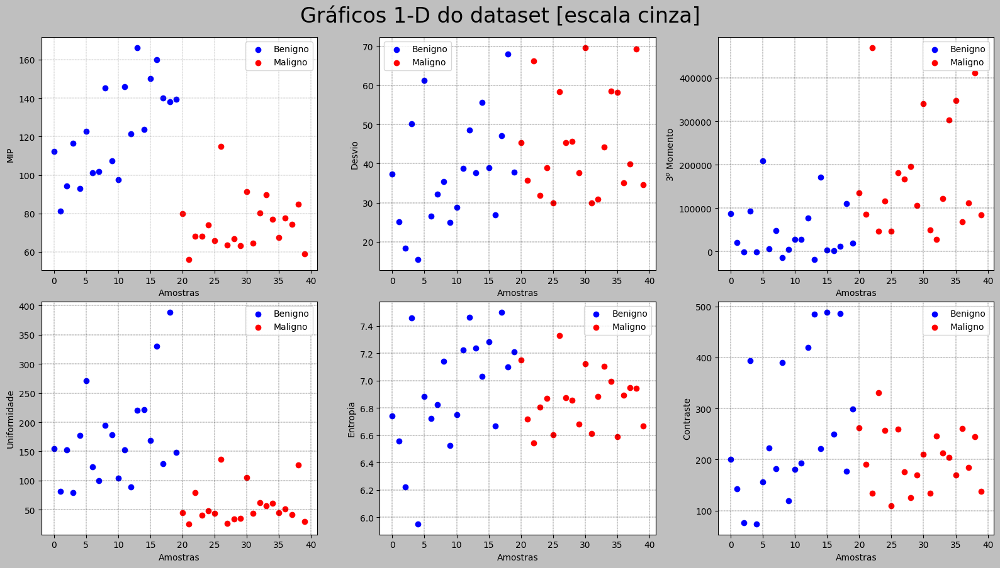

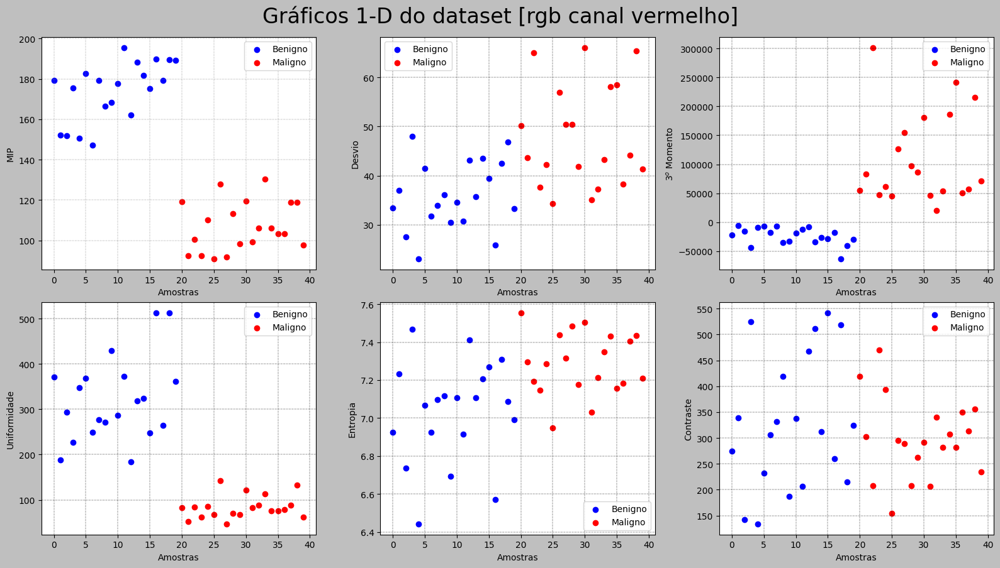

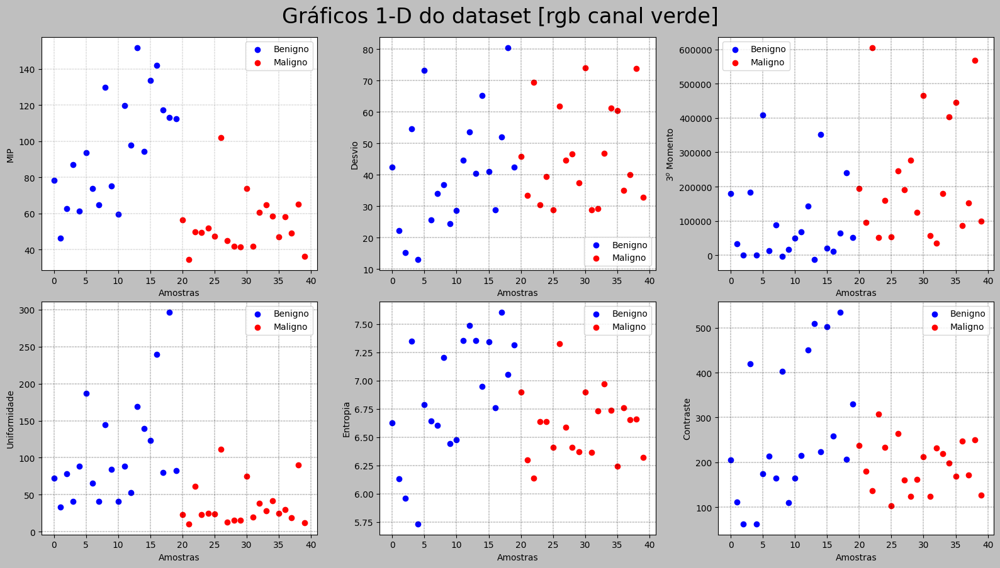

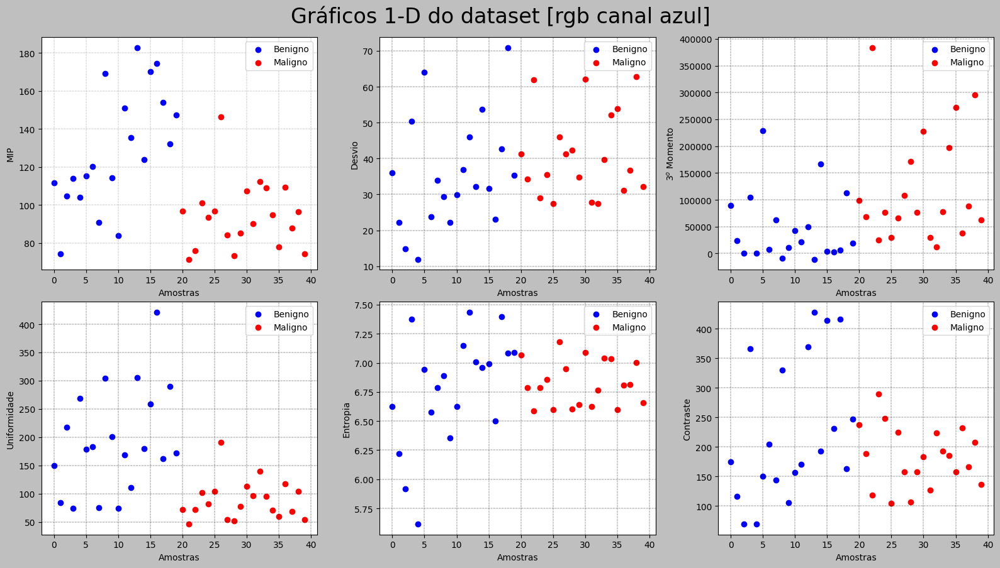

In [ ]:
### Etapa de classificação por meio de um classificador de máquina de vetores de suporte (SVM)
#------------------------------------------------------------------------------#

# Inicializando armazenamento das características em um formato aceitável pelos classificadores
datasets = [
      get_dataset(caracteristicas_cinza, "escala cinza"),
      get_dataset(caracteristicas_rgb_r, "rgb canal vermelho"),
      get_dataset(caracteristicas_rgb_g, "rgb canal verde"),
      get_dataset(caracteristicas_rgb_b, "rgb canal azul")
]

# Visualização das caractéristicas - Observar se alguma característica se sobressai

for i in range(0, len(datasets)):

  fig = plt.figure(0,figsize=(16,10))

  ax1 = fig.add_subplot(231) # MIP
  ax1.grid(b = True, color="gray", linestyle='-.', linewidth=0.3)
  ax1.set_xlabel("Amostras")
  ax1.set_ylabel("MIP")
  ax1.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[0],datasets[i][0][:20])), color="blue", label="Benigno")
  ax1.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[0],datasets[i][0][20:])), color="red", label="Maligno")
  ax1.legend()

  ax2 = fig.add_subplot(232) # Desvio
  ax2.grid(b = True, color="black", linestyle='-.', linewidth=0.3)
  ax2.set_xlabel("Amostras")
  ax2.set_ylabel("Desvio")
  ax2.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[1],datasets[i][0][:20])), color="blue", label="Benigno")
  ax2.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[1],datasets[i][0][20:])), color="red", label="Maligno")
  ax2.legend()

  ax3 = fig.add_subplot(233) # 3o Momento
  ax3.grid(b = True, color="black", linestyle='-.', linewidth=0.3)
  ax3.set_xlabel("Amostras")
  ax3.set_ylabel("$3^o$ Momento")
  ax3.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[2],datasets[i][0][:20])), color="blue", label="Benigno")
  ax3.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[2],datasets[i][0][20:])), color="red", label="Maligno")
  ax3.legend()

  ax4 = fig.add_subplot(234) # Uniformidade
  ax4.grid(b = True, color="black", linestyle='-.', linewidth=0.3)
  ax4.set_xlabel("Amostras")
  ax4.set_ylabel("Uniformidade")
  ax4.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[3],datasets[i][0][:20])), color="blue", label="Benigno")
  ax4.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[3],datasets[i][0][20:])), color="red", label="Maligno")
  ax4.legend()

  ax5 = fig.add_subplot(235) # Entropia
  ax5.grid(b = True, color="black", linestyle='-.', linewidth=0.3)
  ax5.set_xlabel("Amostras")
  ax5.set_ylabel("Entropia")
  ax5.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[4],datasets[i][0][:20])), color="blue", label="Benigno")
  ax5.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[4],datasets[i][0][20:])), color="red", label="Maligno")
  ax5.legend()

  ax6 = fig.add_subplot(236) # Contraste
  ax6.grid(b = True, color="black", linestyle='-.', linewidth=0.3)
  ax6.set_xlabel("Amostras")
  ax6.set_ylabel("Contraste")
  ax6.scatter(np.arange(0,20,1), list(map(lambda amostra: amostra[5],datasets[i][0][:20])), color="blue", label="Benigno")
  ax6.scatter(np.arange(20,40,1), list(map(lambda amostra: amostra[5],datasets[i][0][20:])), color="red", label="Maligno")
  ax6.legend()

  fig.tight_layout()
  fig.subplots_adjust(top=0.85)
  fig.suptitle("Gráficos 1-D do dataset [%s]" % datasets[i][2], y=0.9, fontsize=24)

  fig.savefig(root_folder + "Classificadores/Grafico_1D_Caracteristicas_%s.png" % datasets[i][2])
  plt.show()
  print('\n')

---
Como pode ser visto a melhor separação linear é obtida com as características:
* MIP (Média das Intensidades dos Pixels;
* 3° Momento;
* Uniformidade.

Para o dataset do canal RGB vermelho.

---

In [ ]:
#################################################
# Classificação com todas as 6 características. #
#   SVM: kernel RBF                             #
#################################################
#------------------------------------------------------------------------------#

print("Resultado de classificações por meio de um SVM com kernel RBF (Radial Basis Function)\n")

for i in range(0, len(datasets)):
  media = 0
  maxIter = 1000
  print("Executando %d iterações de classificação para o dataset [%s]..." % (maxIter, datasets[i][2]))
  for k in range(0, maxIter):
    # Separação dos conjuntos de treino e teste
    conj_caract_treino, conj_caract_teste, conj_cond_treino, conj_cond_teste = train_test_split(datasets[i][0], datasets[i][1], train_size=0.3)  # Divisão do data set nos conjuntos de treino e validação, foram utilizados 30% para treino e 70% para validação

    # Normalização - Pré-processamento
    standard_scaler = StandardScaler()
    standard_scaler.fit(conj_caract_treino)
    std_conj_caract_treino = standard_scaler.transform(conj_caract_treino)
    std_conj_caract_teste = standard_scaler.transform(conj_caract_teste)

    # Configuração e treinamento do classificador
    classificador_svm = SVC(kernel='rbf', gamma=1.0, C=1.0) # Configuração do modelo, kernel de base radial do tipo gaussiano
    classificador_svm.fit(conj_caract_treino, conj_cond_treino) # Treinamento

    acc_teste = float(classificador_svm.score(conj_caract_teste, conj_cond_teste)) # Validação
    media += acc_teste


  print("---------------------------------------------------------------------------------------------")
  print("Acurácia média do modelo SVM [Kernel: RBF] obtido para o dataset [%s]: %.2f" % (datasets[i][2], media/float(maxIter)))
  print("---------------------------------------------------------------------------------------------\n")

Resultado de classificações por meio de um SVM com kernel RBF (Radial Basis Function)

Executando 1000 iterações de classificação para o dataset [escala cinza]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo SVM [Kernel: RBF] obtido para o dataset [escala cinza]: 0.47
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [rgb canal vermelho]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo SVM [Kernel: RBF] obtido para o dataset [rgb canal vermelho]: 0.46
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [rgb canal verde]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo S

In [ ]:
#################################################
# Classificação com todas as 6 características. #
#   SVM: kernel linear                          #
#################################################

# Desabilita os avisos de quando o classificador SVM não consegue convergir em
# resultado final. Estes avisos apareceram para os datasets dos canais RGB verde
# e azul.
# Para habilitar os avisos, basta reiniciar o ambiente de execução e comentar o
# comando seguinte antes de executar a célula. Porém a saída pode ficar
# extremamente poluída para muitas iterações.

simplefilter("ignore", category=ConvergenceWarning)

#------------------------------------------------------------------------------#

print("Resultado de classificações por meio de um SVM com kernel linear\n")

for i in range(0, len(datasets)):
  media = 0
  maxIter = 1000
  print("Executando %d iterações de classificação para o dataset [%s]..." % (maxIter, datasets[i][2]))
  for k in range(0, maxIter):
    # Separação dos conjuntos de treino e teste
    conj_caract_treino, conj_caract_teste, conj_cond_treino, conj_cond_teste = train_test_split(datasets[i][0], datasets[i][1], train_size=0.3) # Divisão do data set nos conjuntos de treino e validação, foram utilizados 30% para treino e 70% para validação

    # Normalização - Pré-processamento
    standard_scaler = StandardScaler()
    standard_scaler.fit(conj_caract_treino)
    std_conj_caract_treino = standard_scaler.transform(conj_caract_treino)
    std_conj_caract_teste = standard_scaler.transform(conj_caract_teste)

    # Configuração e treinamento do classificador
    classificador_svm = LinearSVC(C=1.0, max_iter=10000) # Configuração do modelo, kernel de base radial do tipo gaussiano
    classificador_svm.fit(conj_caract_treino, conj_cond_treino) # Treinamento

    acc_teste = float(classificador_svm.score(conj_caract_teste, conj_cond_teste)) # Validação
    media += acc_teste


  print("---------------------------------------------------------------------------------------------")
  print("Acurácia média do modelo SVM [Kernel: Linear] obtido para o dataset [%s]: %.2f" % (datasets[i][2], media/float(maxIter)))
  print("---------------------------------------------------------------------------------------------\n")

Resultado de classificações por meio de um SVM com kernel linear

Executando 1000 iterações de classificação para o dataset [escala cinza]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo SVM [Kernel: Linear] obtido para o dataset [escala cinza]: 0.70
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [rgb canal vermelho]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo SVM [Kernel: Linear] obtido para o dataset [rgb canal vermelho]: 1.00
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [rgb canal verde]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo SVM [Kernel: Lin

---
**Como pode ser visto o melhor resultado foi obtido pelo dataset das características extraídas do canal RGB vermelho, através de um *kernel* linear.**

---



# Classificação via Árvore de Decisão


---------------------------------------------------------------------------------------------
Iniciando árvore de decisão, critério: Gini
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [escala cinza]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [escala cinza]: 0.88
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



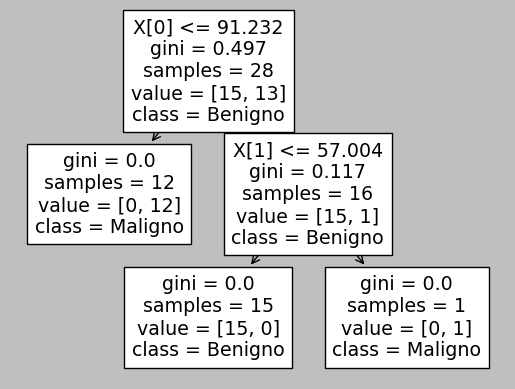

Executando 1000 iterações de classificação para o dataset [rgb canal vermelho]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal vermelho]: 0.99
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



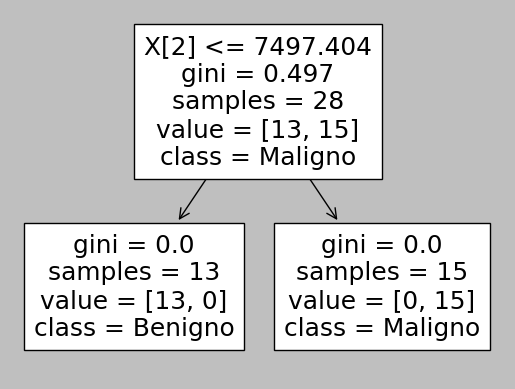

Executando 1000 iterações de classificação para o dataset [rgb canal verde]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal verde]: 0.80
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



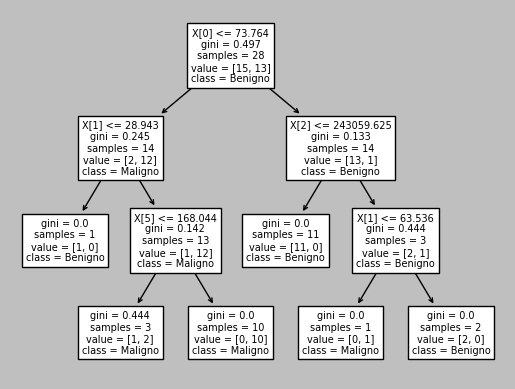

Executando 1000 iterações de classificação para o dataset [rgb canal azul]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal azul]: 0.73
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



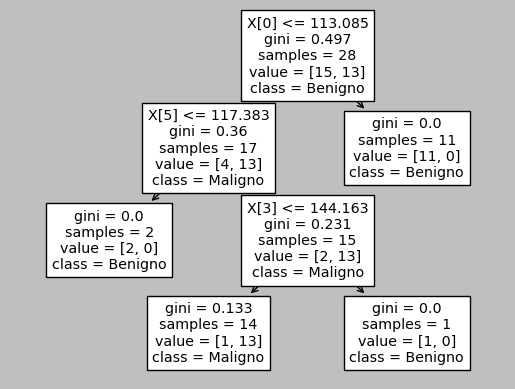


---------------------------------------------------------------------------------------------
Iniciando árvore de decisão, critério: Entropia
---------------------------------------------------------------------------------------------

Executando 1000 iterações de classificação para o dataset [escala cinza]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [escala cinza]: 0.88
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



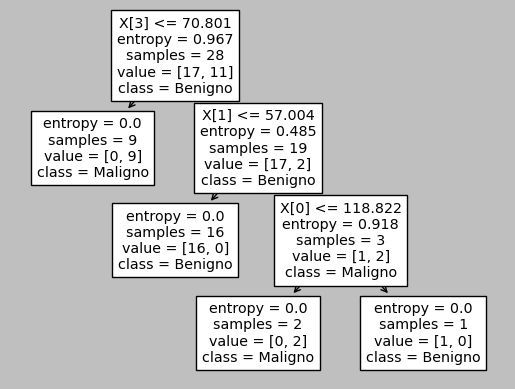

Executando 1000 iterações de classificação para o dataset [rgb canal vermelho]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal vermelho]: 0.99
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



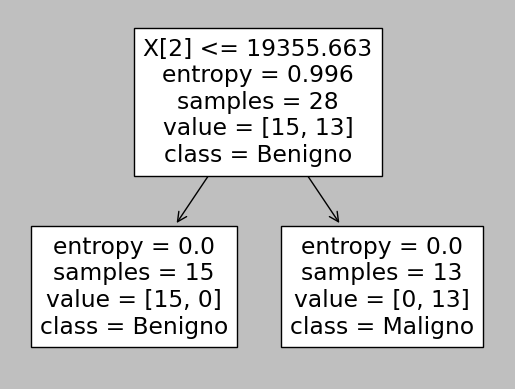

Executando 1000 iterações de classificação para o dataset [rgb canal verde]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal verde]: 0.81
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



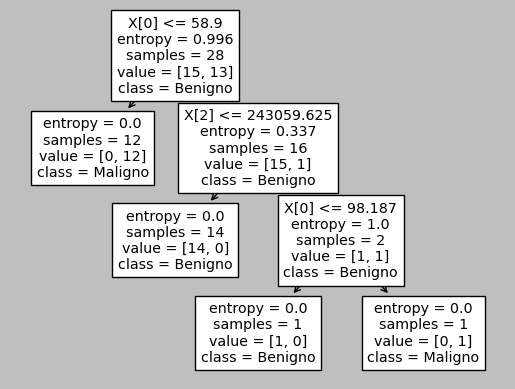

Executando 1000 iterações de classificação para o dataset [rgb canal azul]...
---------------------------------------------------------------------------------------------
Acurácia média do modelo J48 obtido para o dataset [rgb canal azul]: 0.71
---------------------------------------------------------------------------------------------

Exemplo de Classificação [0 - Benigno, 1 - Maligno]: 

[0 1]
Exemplo de uma árvore de Decisão: 



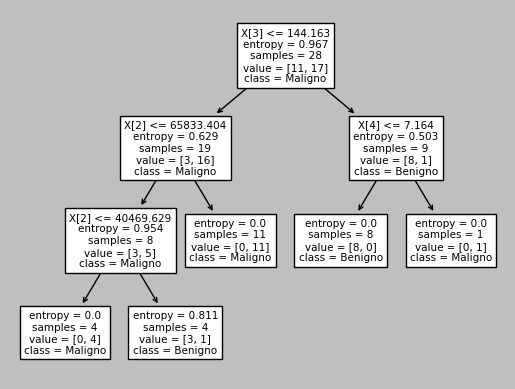

In [ ]:
### Etapa de classificação via árvore de decisão
#------------------------------------------------------------------------------#

# Classificação das imagens via Árvore de Decisão

# Inicializando armazenamento das características em um formato aceitável pelos classificadores

datasets = [
      get_dataset(caracteristicas_cinza, "escala cinza"),
      get_dataset(caracteristicas_rgb_r, "rgb canal vermelho"),
      get_dataset(caracteristicas_rgb_g, "rgb canal verde"),
      get_dataset(caracteristicas_rgb_b, "rgb canal azul")
]

print("\n---------------------------------------------------------------------------------------------")
print("Iniciando árvore de decisão, critério: Gini")
print("---------------------------------------------------------------------------------------------\n")

# Gini Index - Classificação utilizando o critério Gini

for i in range(0, len(datasets)):
  media = 0
  maxIter = 1000
  print("Executando %d iterações de classificação para o dataset [%s]..." % (maxIter, datasets[i][2]))
  for k in range(0, maxIter):
    # Separação dos conjuntos de treino e teste
    conj_caract_treino, conj_caract_teste, conj_cond_treino, conj_cond_teste = train_test_split(datasets[i][0], datasets[i][1], test_size=0.3) # Divisão dos data set para os conjuntos de treinamento e validação. 70% para treino e 30% para a validação

    # Normalização - Pré-processamento
    standard_scaler = StandardScaler()
    standard_scaler.fit(conj_caract_treino)
    std_conj_caract_treino = standard_scaler.transform(conj_caract_treino)
    std_conj_caract_teste = standard_scaler.transform(conj_caract_teste)

    # Configuração e treinamento do classificador
    classificador_j48 = tree.DecisionTreeClassifier(criterion="gini", random_state=0, max_depth=3) # Utilização do critério Gini e com um máximo de profundidade de árvore sendo 3
    classificador_j48.fit(conj_caract_treino, conj_cond_treino) # Realizando o treinamento

    acc_teste = float(classificador_j48.score(conj_caract_teste, conj_cond_teste)) # Validando classificador
    media += acc_teste

  print("---------------------------------------------------------------------------------------------")
  print("Acurácia média do modelo J48 obtido para o dataset [%s]: %.2f" % (datasets[i][2], media/float(maxIter)))
  print("---------------------------------------------------------------------------------------------\n")
  # Gray layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "escala cinza":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[112.34, 37.26,	86941.95,	154.4,	6.74,	200.78], [79.89,	45.43,	135773.58,	44.69,	7.15,	261.89]])
    print(y_pred)

  # Green layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal verde":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[78.26,	42.52,	179696.4,	72.49,	6.63,	206.12], [56.59,	45.8,	194676.19,	23.26,	6.9,	237.12]])
    print(y_pred)

  # Red layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal vermelho":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[151.88, 27.61,	-15115.91,	293.75,	6.74,	142.42], [119.12, 50.15, 55589.8,	82.4,	7.56,	419.69]])
    print(y_pred)

  # Blue layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal azul":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[111.7,	36.06,	89630.73,	149.16,	6.63,	174.05], [96.65,	41.33,	98676.06,	72.13,	7.07,	237.12]])
    print(y_pred)
  print("Exemplo de uma árvore de Decisão: \n")
  a = tree.plot_tree(classificador_j48, class_names=['Benigno', 'Maligno']) # Plotagem de uma árvore de decisão
  plt.show()

print("\n---------------------------------------------------------------------------------------------")
print("Iniciando árvore de decisão, critério: Entropia")
print("---------------------------------------------------------------------------------------------\n")

# Entropy - Classificação utilizando como critério entropia

for i in range(0, len(datasets)):
  media = 0
  maxIter = 1000
  print("Executando %d iterações de classificação para o dataset [%s]..." % (maxIter, datasets[i][2]))
  for k in range(0, maxIter):
    # Separação dos conjuntos de treino e teste
    conj_caract_treino, conj_caract_teste, conj_cond_treino, conj_cond_teste = train_test_split(datasets[i][0], datasets[i][1], test_size=0.3) # Divisão do data set nos conjuntos de treino e validação, foi utilizada uma escala de 70% para treino e 30% para validação

    # Normalização - Pré-processamento
    standard_scaler = StandardScaler()
    standard_scaler.fit(conj_caract_treino)
    std_conj_caract_treino = standard_scaler.transform(conj_caract_treino)
    std_conj_caract_teste = standard_scaler.transform(conj_caract_teste)

    # Configuração e treinamento do classificador
    classificador_j48 = tree.DecisionTreeClassifier(criterion="entropy", random_state=0, max_depth=3)
    classificador_j48.fit(conj_caract_treino, conj_cond_treino)
    y_pred = classificador_j48.predict(conj_caract_teste)

    acc_teste = float(classificador_j48.score(conj_caract_teste, conj_cond_teste))
    media += acc_teste

  print("---------------------------------------------------------------------------------------------")
  print("Acurácia média do modelo J48 obtido para o dataset [%s]: %.2f" % (datasets[i][2], media/float(maxIter)))
  print("---------------------------------------------------------------------------------------------\n")
  # Gray layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "escala cinza":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[112.34, 37.26,	86941.95,	154.4,	6.74,	200.78], [79.89,	45.43,	135773.58,	44.69,	7.15,	261.89]])
    print(y_pred)

  # Green layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal verde":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[78.26,	42.52,	179696.4,	72.49,	6.63,	206.12], [56.59,	45.8,	194676.19,	23.26,	6.9,	237.12]])
    print(y_pred)

  # Red layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal vermelho":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[151.88, 27.61,	-15115.91,	293.75,	6.74,	142.42], [119.12, 50.15, 55589.8,	82.4,	7.56,	419.69]])
    print(y_pred)

  # Blue layer - Previsões de classificação pelo modelo para exemplificação, o primeiro é uma imagem de classe 0 (Benigno) e o segundo é uma imagem de classe 1 (Maligno)
  if datasets[i][2] == "rgb canal azul":
    print("Exemplo de Classificação [0 - Benigno, 1 - Maligno]: \n")
    y_pred = classificador_j48.predict([[111.7,	36.06,	89630.73,	149.16,	6.63,	174.05], [96.65,	41.33,	98676.06,	72.13,	7.07,	237.12]])
    print(y_pred)
  print("Exemplo de uma árvore de Decisão: \n")
  a = tree.plot_tree(classificador_j48, class_names=['Benigno', 'Maligno']) # Plotagem de uma árvore de decisão
  plt.show()


---
**O dataset da banda vermelha se mostrou superior aos outros datasets na classificação via árvore de decisão, o mesmo que foi notado ao utilizar o modelo de classificação SVM.**

---